In [2]:
import math
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import pandas as pd

In [3]:
import os
print(os.getcwd())

C:\Users\Cheng\OneDrive\Documents\Proj\VarianceArithemtic\IPyNb


In [4]:
df = pd.read_csv("../Cpp/Output/FFT_Step_5_Quart.txt", sep='\t')
df.head()

,SinSource,NoiseType,Noise,Signal,Order,Freq,Test,Step,Imag,Value,...,22,23,24,25,26,27,28,29,30,31
0,Quart,NaN,0.0,NaN,5,NaN,CosSin,NaN,0,1,...,-5.555702e-01,-6.343933e-01,-7.071068e-01,-7.730105e-01,-8.314696e-01,-8.819213e-01,-9.238795e-01,-9.569403e-01,-9.807853e-01,-9.951847e-01
1,Quart,NaN,0.0,NaN,5,NaN,CosSin,NaN,0,0,...,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16
2,Quart,NaN,0.0,NaN,5,NaN,CosSin,NaN,1,1,...,8.314696e-01,7.730105e-01,7.071068e-01,6.343933e-01,5.555702e-01,4.713967e-01,3.826834e-01,2.902847e-01,1.950903e-01,9.801714e-02
3,Quart,NaN,0.0,NaN,5,NaN,CosSin,NaN,1,0,...,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,1.110223e-16,5.551115e-17,5.551115e-17,5.551115e-17,2.775558e-17,1.387779e-17
4,Quart,Gaussian,0.0,Sin,5,1.0,Forward,Input,0,1,...,-9.238795e-01,-9.807853e-01,-1.000000e+00,-9.807853e-01,-9.238795e-01,-8.314696e-01,-7.071068e-01,-5.555702e-01,-3.826834e-01,-1.950903e-01


In [5]:
df.columns

Index(['SinSource', 'NoiseType', 'Noise', 'Signal', 'Order', 'Freq', 'Test',
       'Step', 'Imag', 'Value', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
       '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31'],
      dtype='object')

In [6]:
sIndex = [str(i) for i in range(32)]

In [7]:
df['Noise'].unique()

array([0.e+00, 1.e-15, 1.e-12, 1.e-09, 1.e-06, 1.e-03, 1.e+00])

In [81]:
def PlotOutput( signal, freq, test, noiseType='Gaussian', noise=0, step = '8' ):
    df['Imag Name'] = np.where(df['Imag'], 'Imag ', 'Real ')
    df['Value Name'] = np.where(df['Value'], 'Value', 'Uncertainty')
    df['Legend'] = df['Imag Name'] + df['Value Name']
    df.set_index('Legend')
    dfPlot = df[(df['NoiseType']==noiseType) & (df['Noise']==noise) &
                (df['Signal']==signal) & (df['Freq']==freq) & (df['Test']==test) & (df['Step']==step)].set_index('Legend')
    ax = dfPlot[sIndex].T.plot(style=['--', ':']*2, color=['black']*2+['gray']*2, grid=True, 
            xlabel=f'{"Frequence" if test == "Forward" else "Time"} Index j', ylabel='Value Error or Uncertainty',
            title=f'${signal}(2\pi\; {freq} \;j/2^5)$ {test} using Quart with noise=0' if freq else f'${signal}(j/2^5)$ {test} using Quart with noise=0')
    ax.legend(loc='upper right', bbox_to_anchor=(1.4, 1.0))

# Sin of Different Frequency

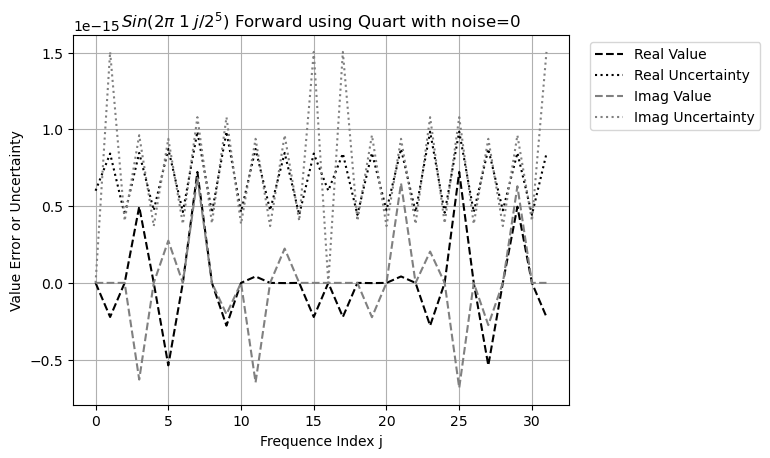

In [93]:
PlotOutput('Sin', 1, 'Forward')

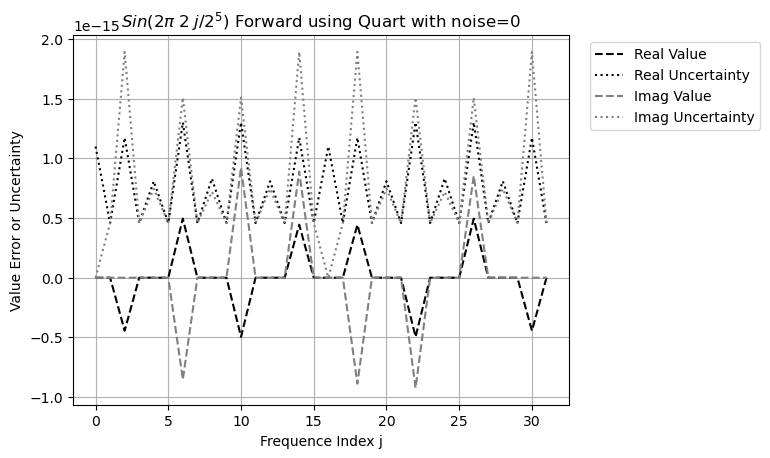

In [83]:
PlotOutput('Sin', 2, 'Forward')

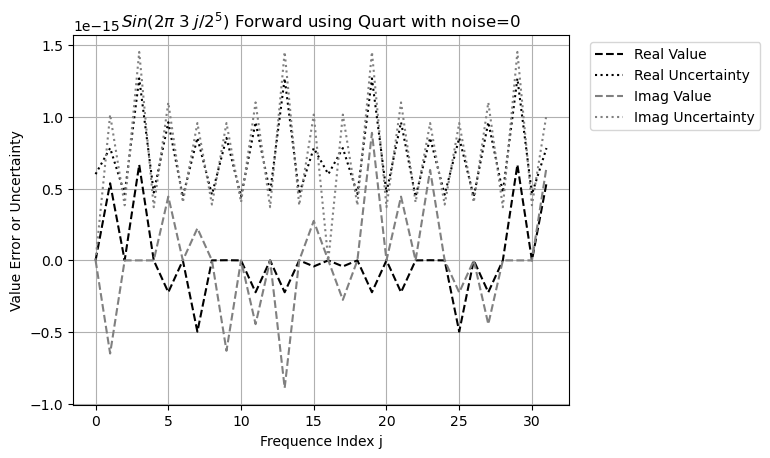

In [84]:
PlotOutput('Sin', 3, 'Forward')

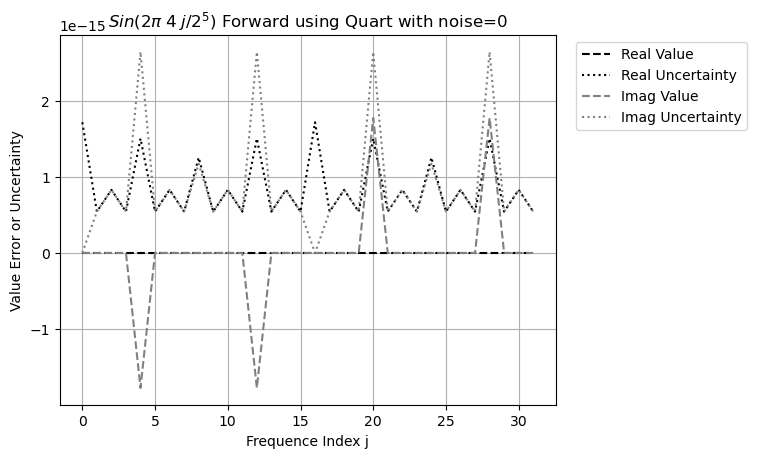

In [85]:
PlotOutput('Sin', 4, 'Forward')

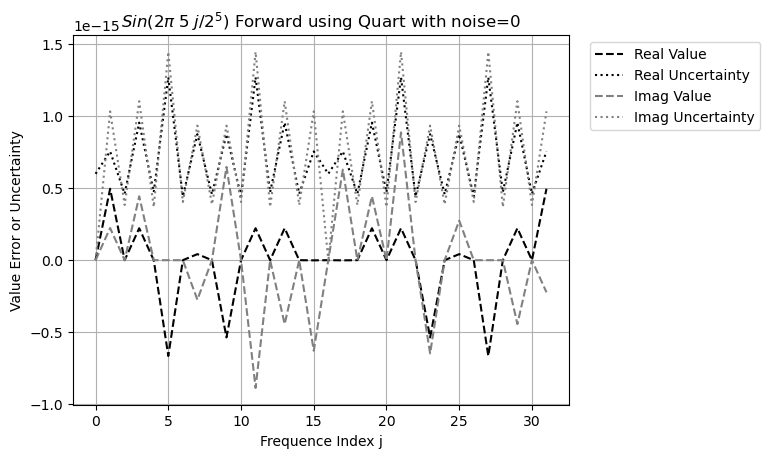

In [86]:
PlotOutput('Sin', 5, 'Forward')

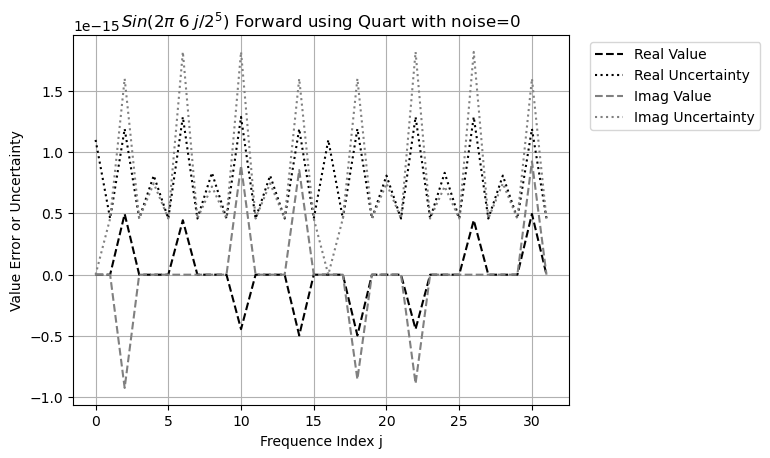

In [87]:
PlotOutput('Sin', 6, 'Forward')

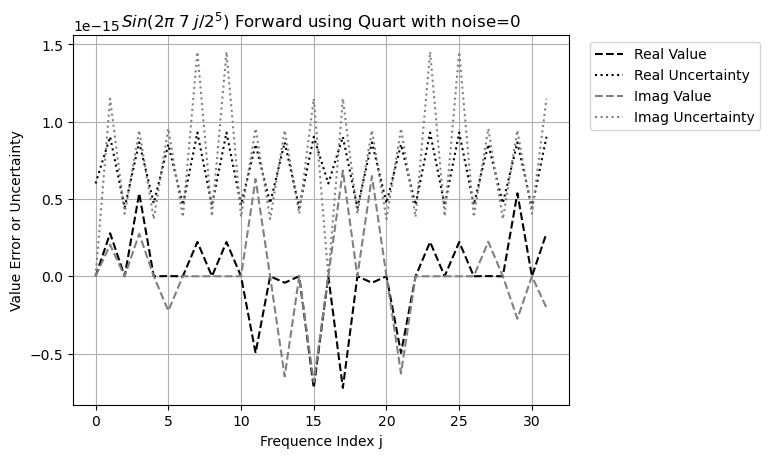

In [88]:
PlotOutput('Sin', 7, 'Forward')

# Sin vs Cos

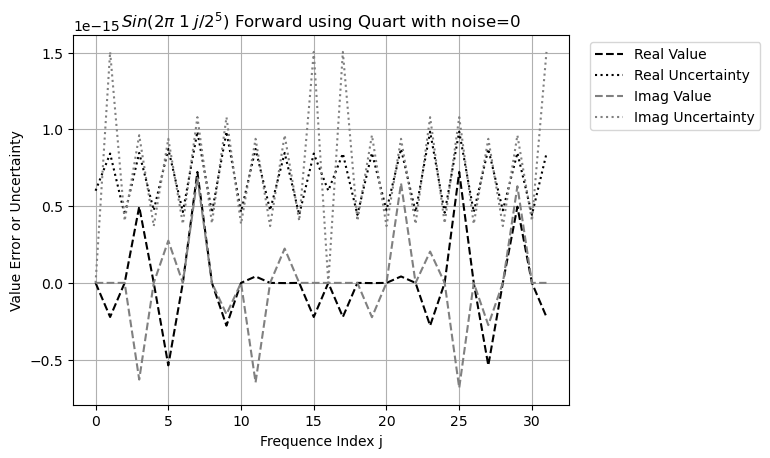

In [90]:
PlotOutput('Sin', 1, 'Forward')

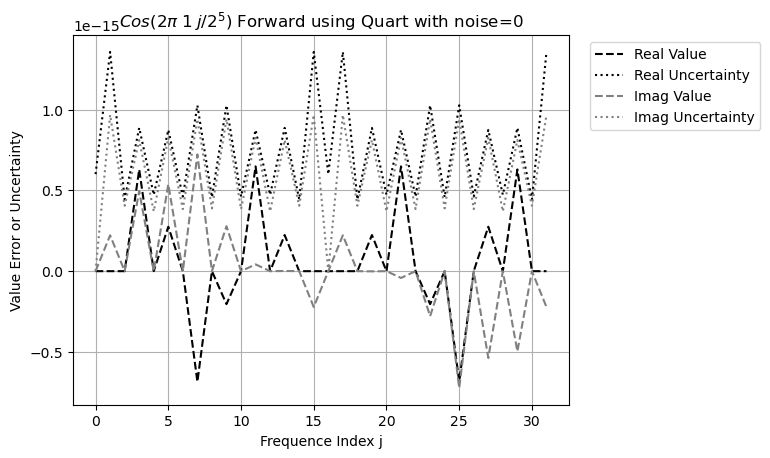

In [91]:
PlotOutput('Cos', 1, 'Forward')

In [118]:
def PlotSpectra( sinSource, order, signal, freq, test, noiseType='Gaussian', noise=0,
                  sColor = ['r','g','b','y','c','m'] ):
    
    fig, ax = plt.subplots()
    ax.set_title(f'{signal}(2$\pi$ {freq}/2^{order}) {test} using {sinSource} noise={noise}')
    ax.set_xlabel('x')
    ax.set_ylabel('Uncertainty or Absolute Value Error')
    #ax.set_yscale('log')
    #ax.set_ylim(ylim)
    plt.grid(True)
    
    dfPlot = df[(df['SinSource']==sinSource) & (df['NoiseType']==noiseType) & (df['Noise']==noise) &
                (df['Order']==order) & (df['Signal']==signal) & (df['Freq']==freq)]\
                .sort_values('Index')
    dfReal = dfPlot[dfPlot['Imag'] == 0]
    dfImag = dfPlot[dfPlot['Imag'] == 1]
    ax.plot(dfReal['Index'], dfReal[f'{test} Uncertainty'], 'k-', label=f'Uncertainty Real')
    ax.plot(dfImag['Index'], dfImag[f'{test} Uncertainty'], c='gray', ls='-', label=f'Uncertainty Imag')
    ax.plot(dfReal['Index'], np.abs(dfReal[f'{test} Error']), 'k--', label=f'Value Error Real')
    ax.plot(dfImag['Index'], np.abs(dfImag[f'{test} Error']), c='gray', ls=':', label=f'Value Error Imag')
    
    ax.legend(bbox_to_anchor=(1.0, 1.0))


In [119]:
def PlotAllForFreq(order, freq, singal):
    for test in ('Forward', 'Reverse', 'Roundtrip'):
        for sinSource in ('IndexSin', 'LibSin'):
            PlotSpectra(sinSource, order, signal, freq, test)

In [120]:
def PlotAllForTest(sinSource, order, signal, test):
    for freq in range(1, 8):
        PlotSpectra(sinSource, order, signal, freq, test)

In [121]:
ORDER=6
NOISE=1e-12

# For IndexSin, freq and (1 << (order-1)) - freq are  almost identical only for oder=4

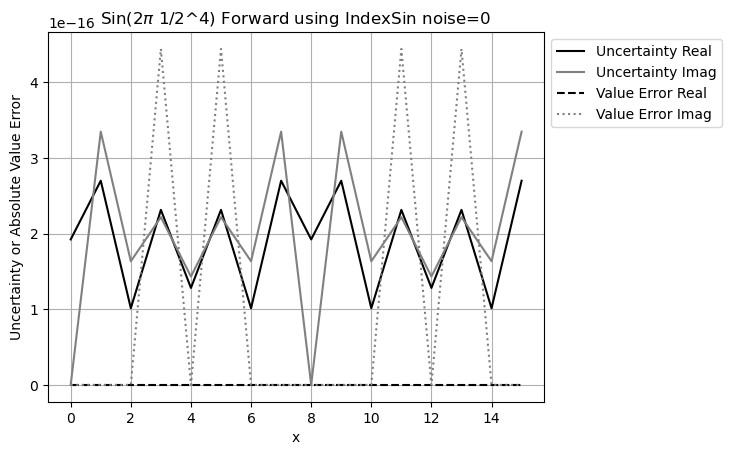

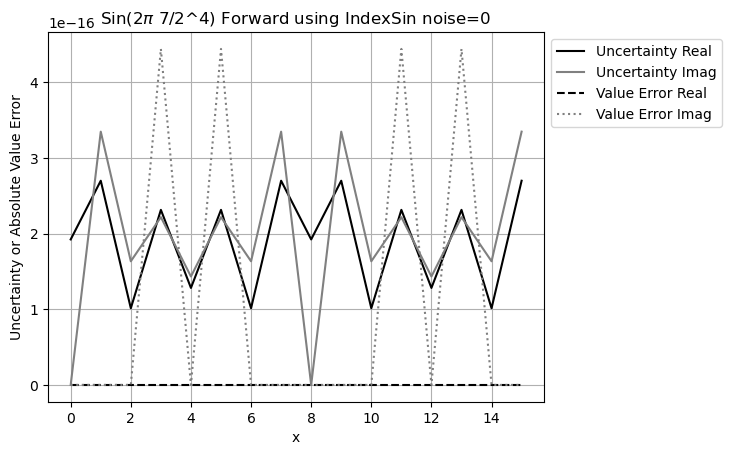

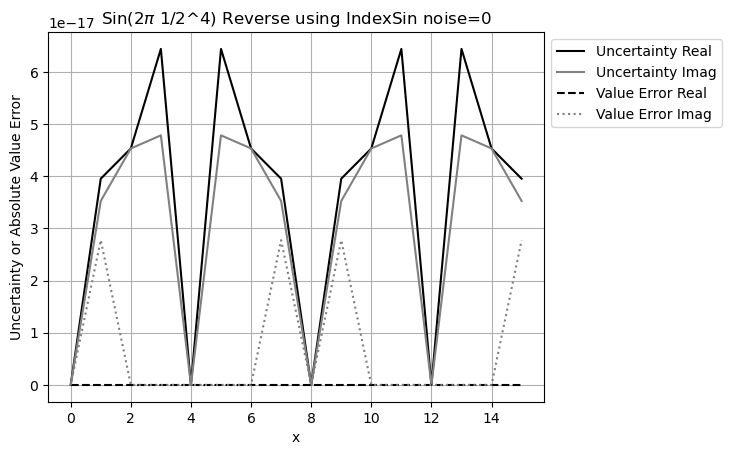

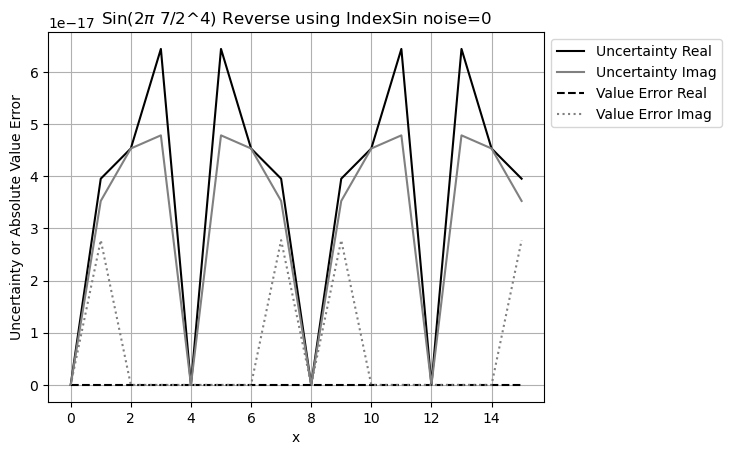

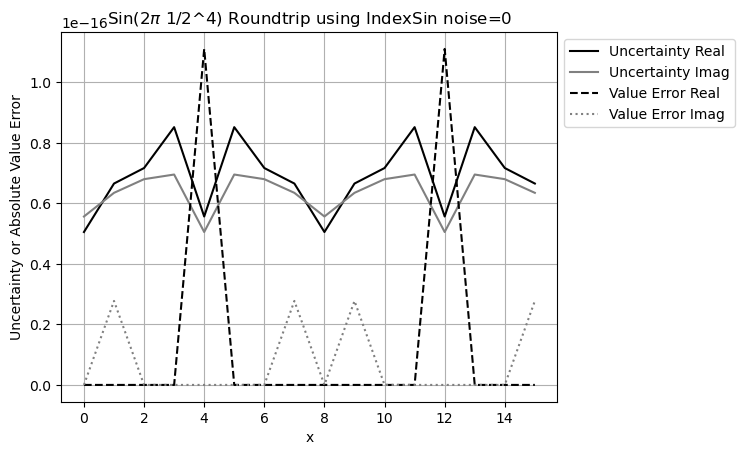

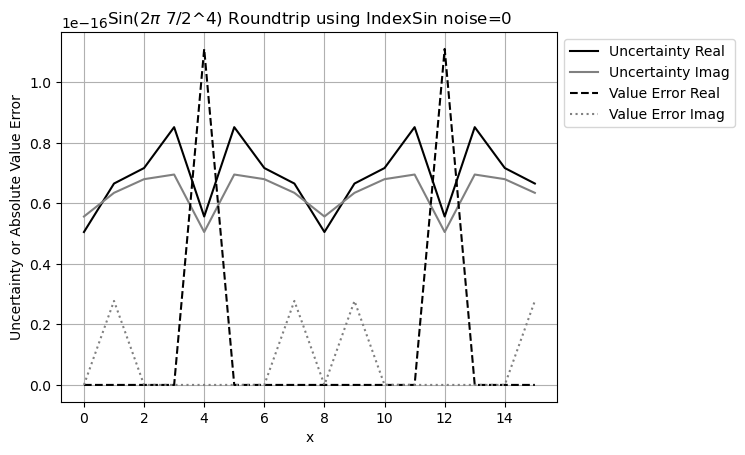

In [122]:
PlotSpectra('IndexSin', 4, 'Sin', 1, 'Forward')
PlotSpectra('IndexSin', 4, 'Sin', 7, 'Forward')
PlotSpectra('IndexSin', 4, 'Sin', 1, 'Reverse')
PlotSpectra('IndexSin', 4, 'Sin', 7, 'Reverse')
PlotSpectra('IndexSin', 4, 'Sin', 1, 'Roundtrip')
PlotSpectra('IndexSin', 4, 'Sin', 7, 'Roundtrip')

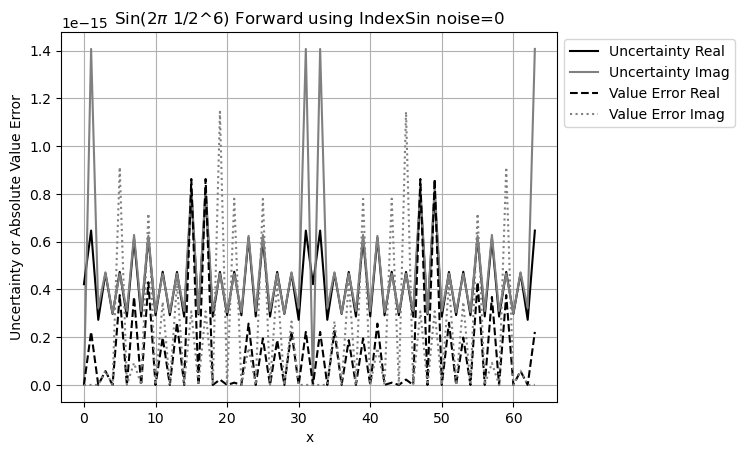

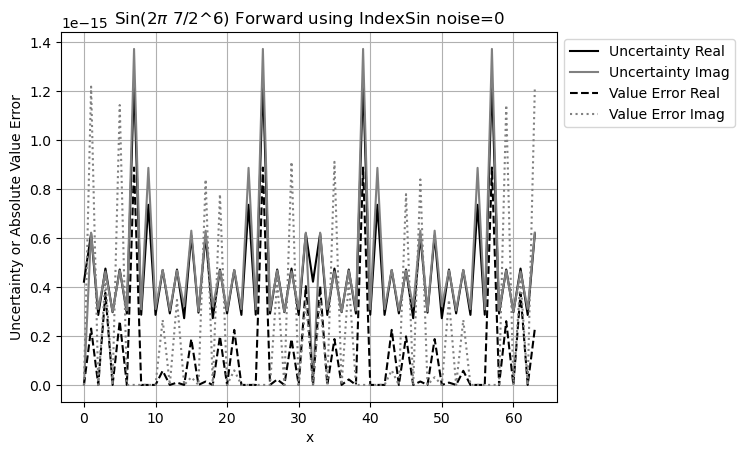

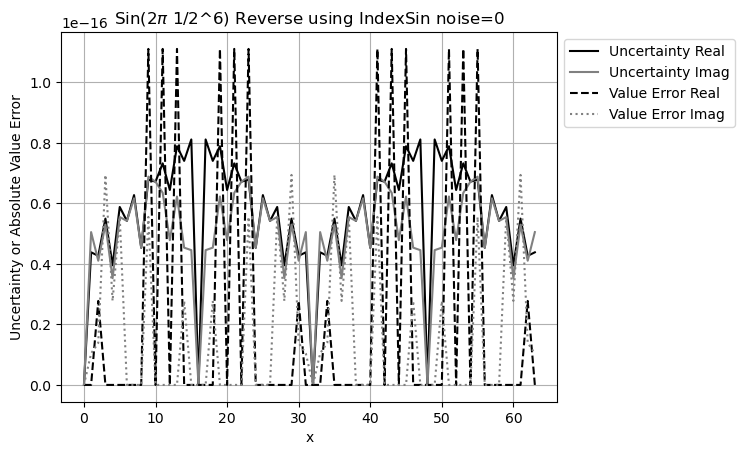

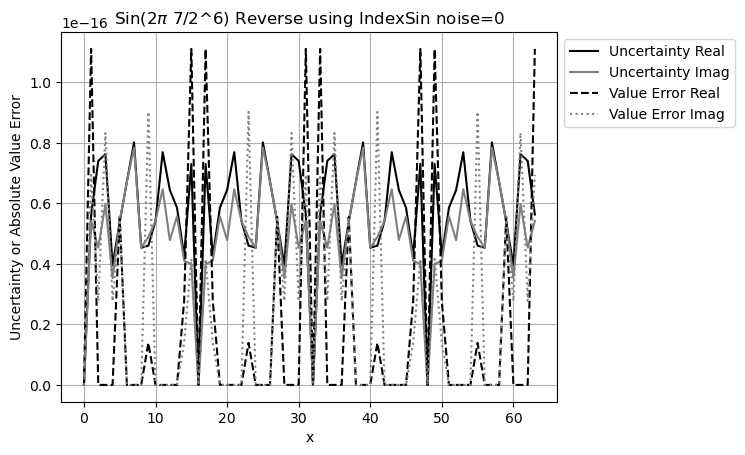

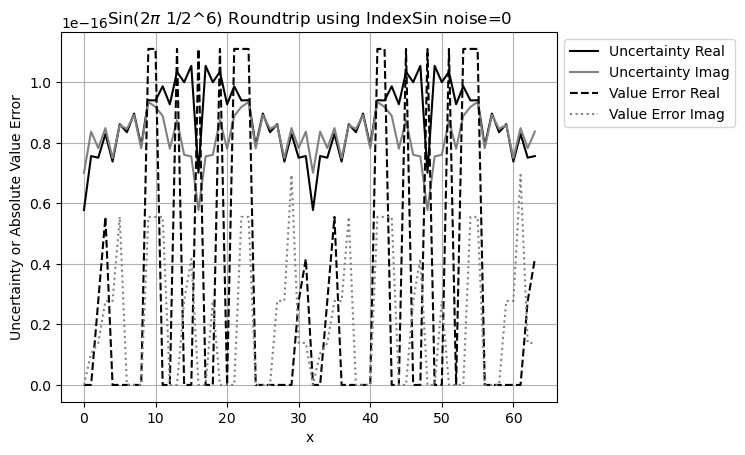

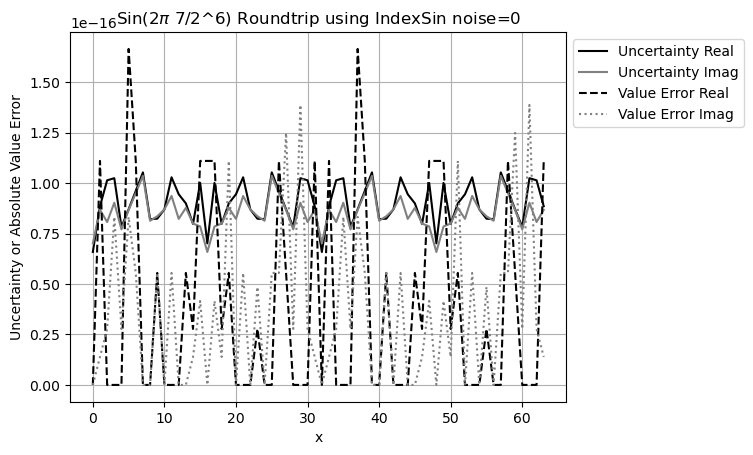

In [123]:
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Sin', 7, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Sin', 7, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Roundtrip')
PlotSpectra('IndexSin', ORDER, 'Sin', 7, 'Roundtrip')

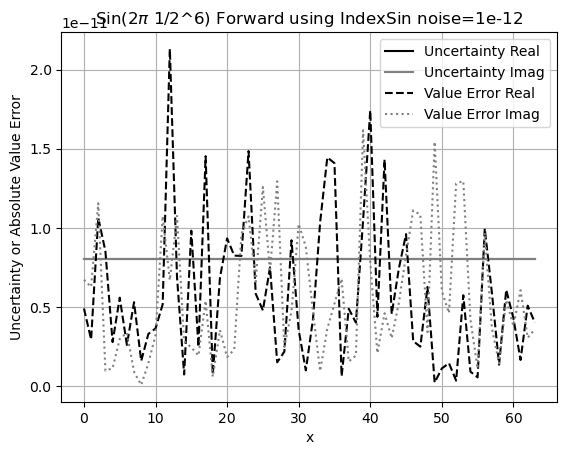

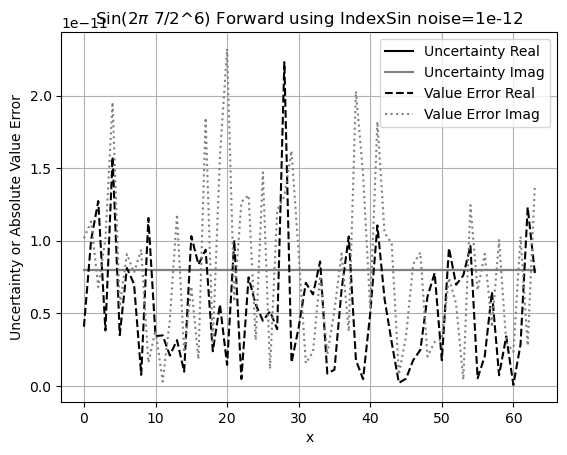

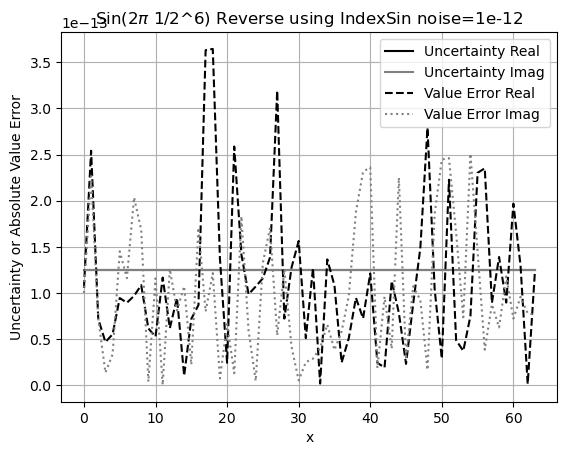

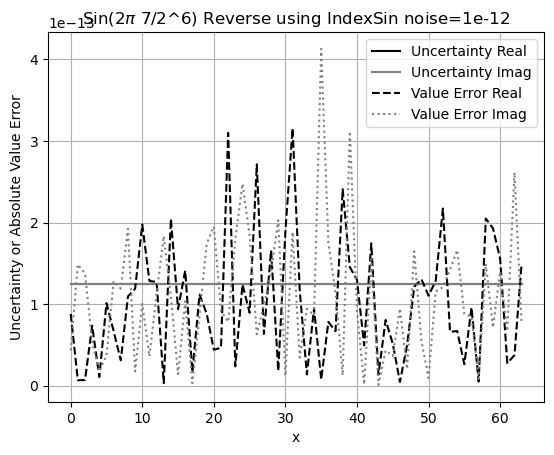

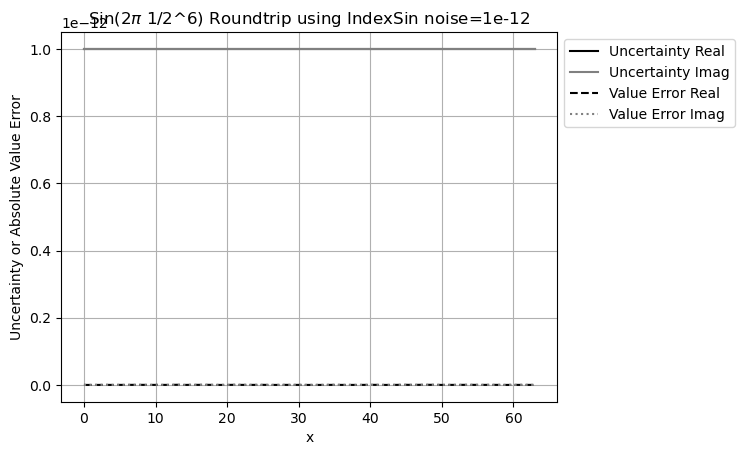

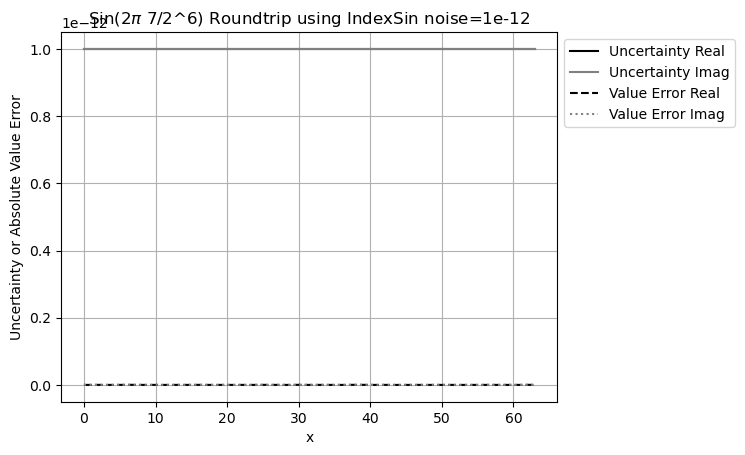

In [124]:
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Forward', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 7, 'Forward', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Reverse', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 7, 'Reverse', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Roundtrip', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 7, 'Roundtrip', noise=NOISE)

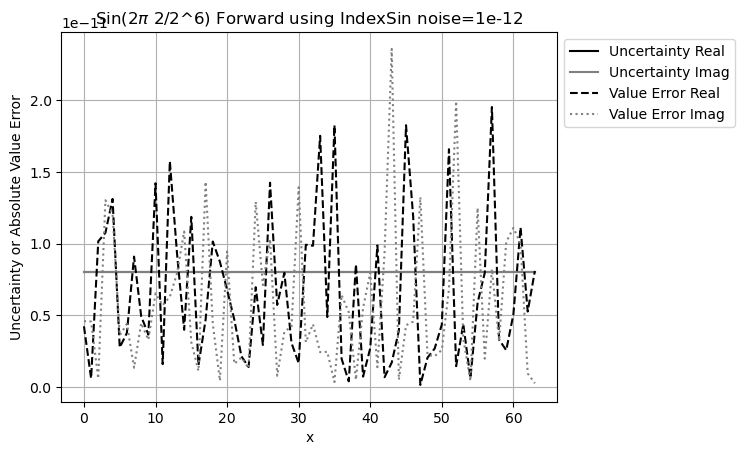

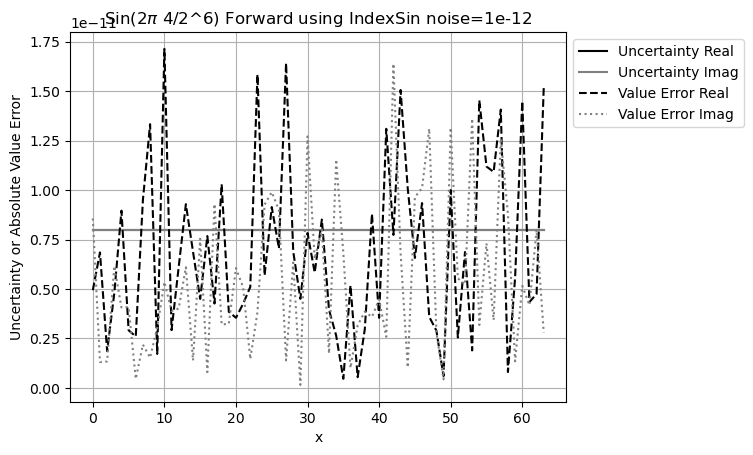

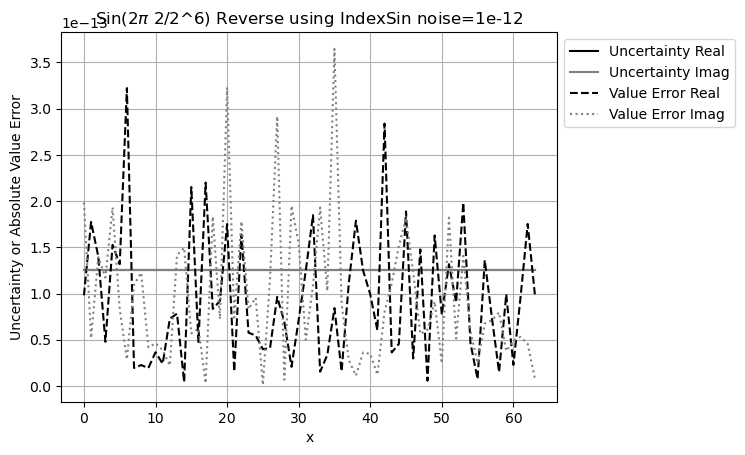

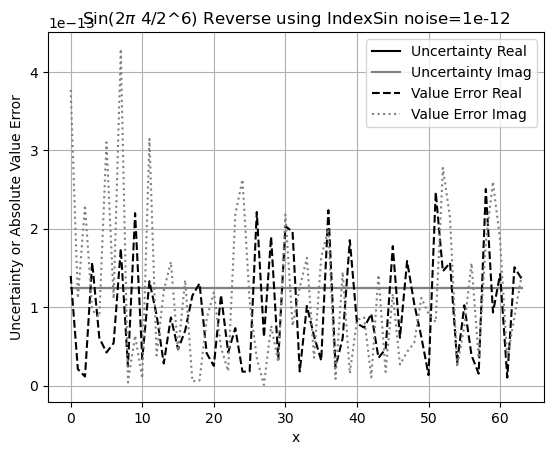

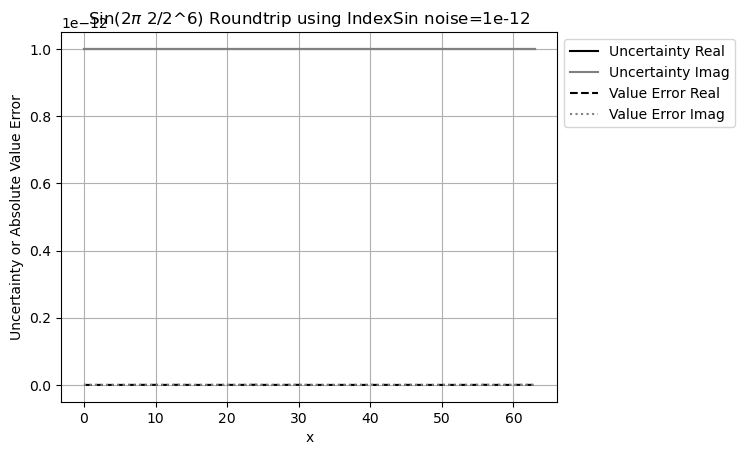

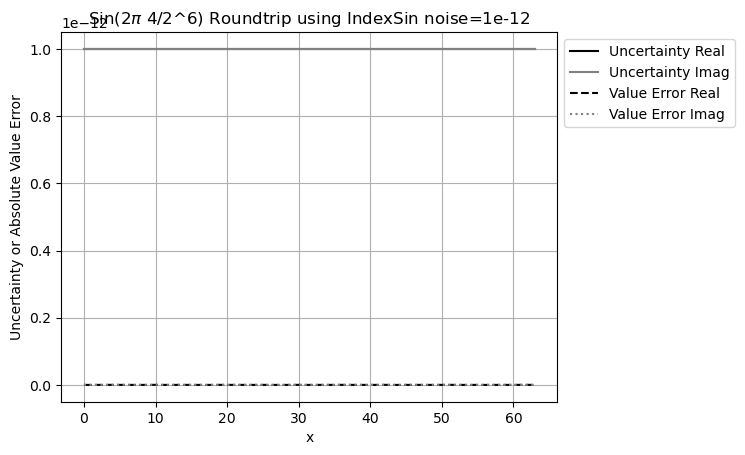

In [125]:
PlotSpectra('IndexSin', ORDER, 'Sin', 2, 'Forward', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 4, 'Forward', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 2, 'Reverse', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 4, 'Reverse', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 2, 'Roundtrip', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 4, 'Roundtrip', noise=NOISE)

# Compare Sin and Cos: The forward is rea-imag flipped. The reverse is identical. The roundtrip is shifted

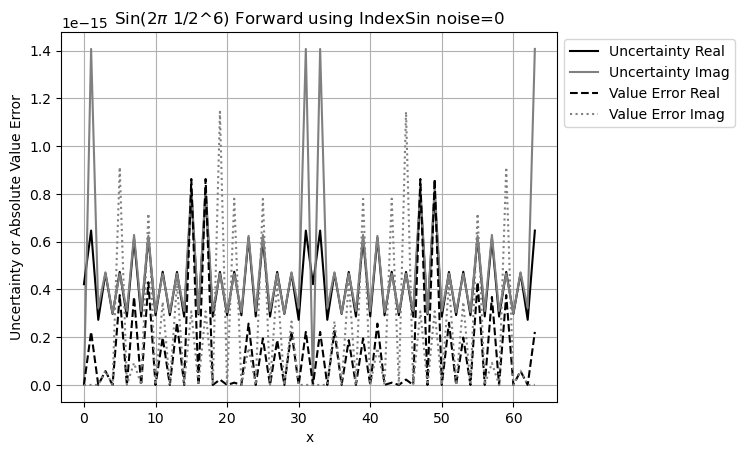

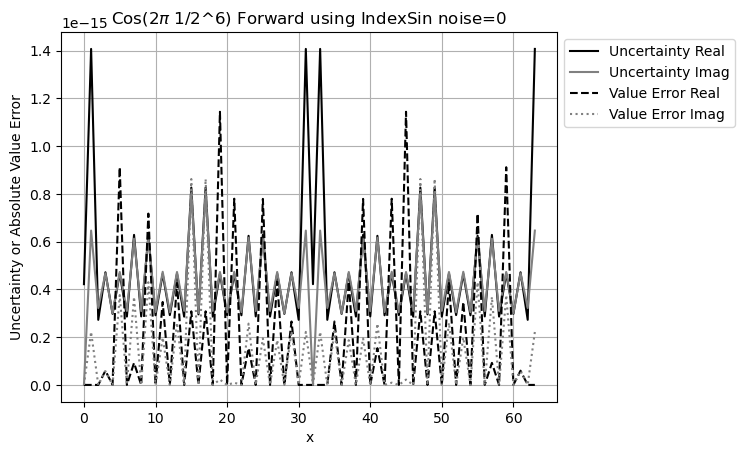

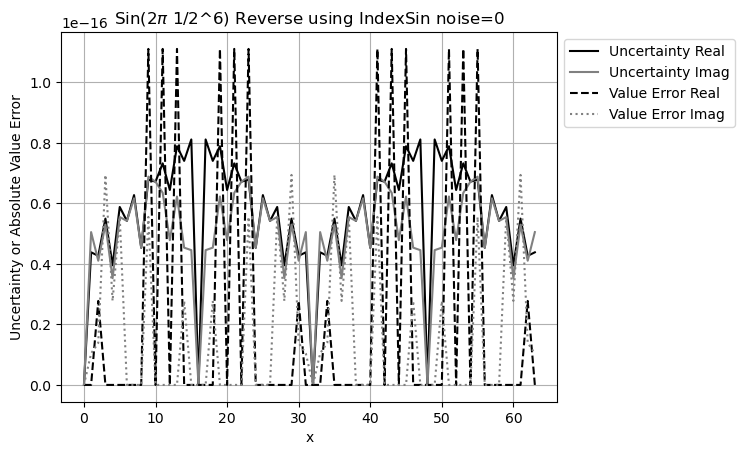

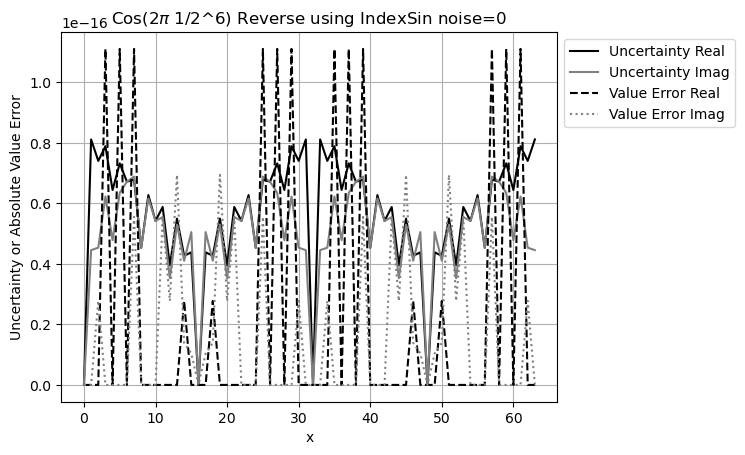

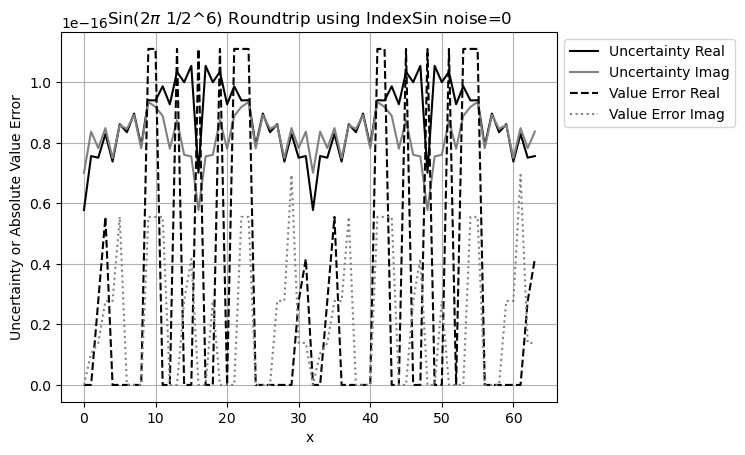

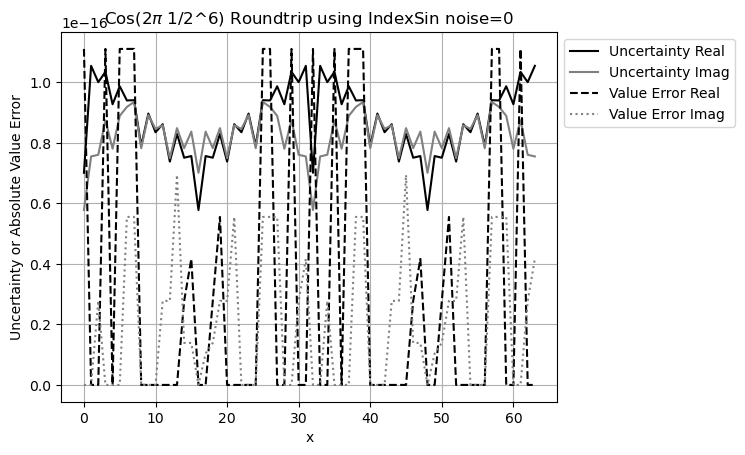

In [126]:
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Cos', 1, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Cos', 1, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Roundtrip')
PlotSpectra('IndexSin', ORDER, 'Cos', 1, 'Roundtrip')

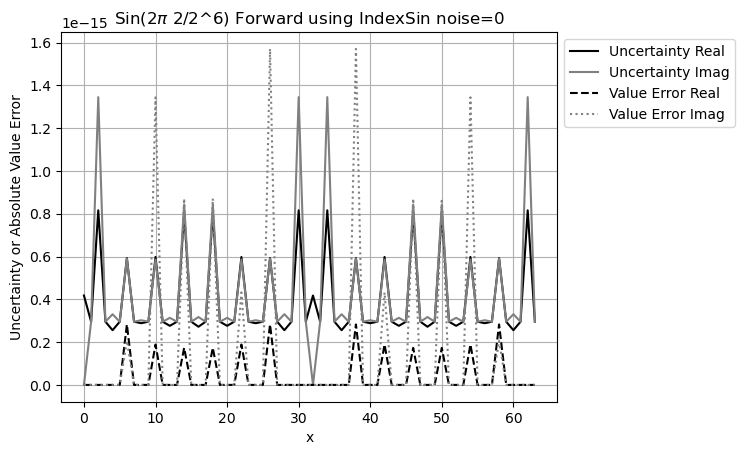

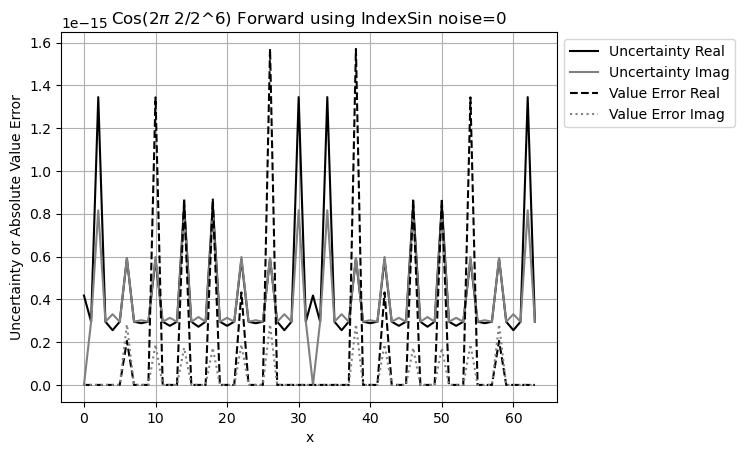

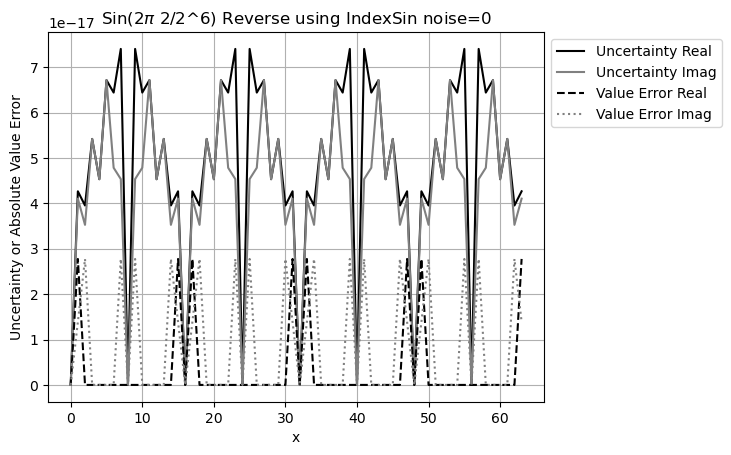

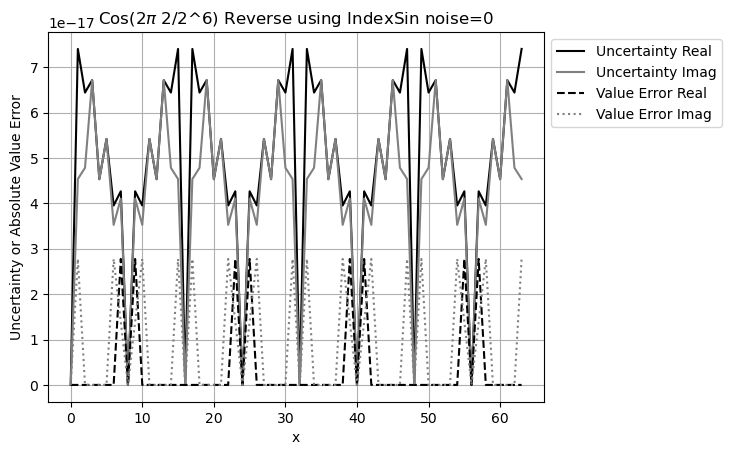

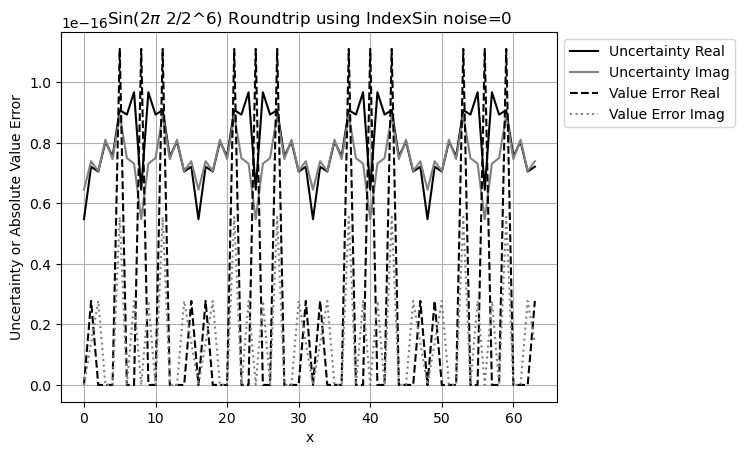

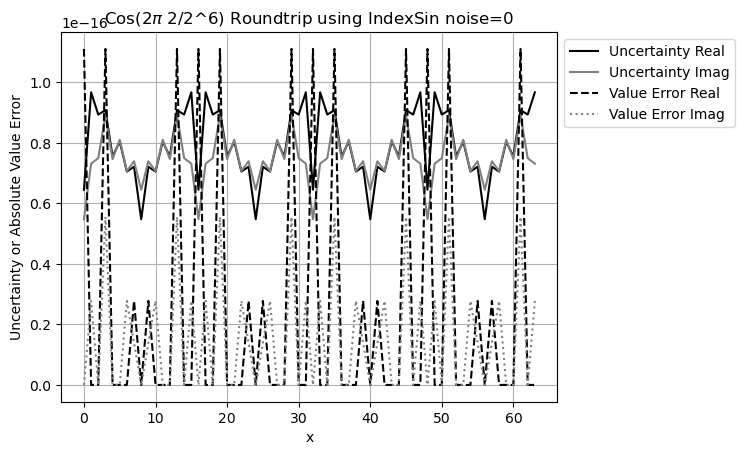

In [127]:
PlotSpectra('IndexSin', ORDER, 'Sin', 2, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Cos', 2, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Sin', 2, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Cos', 2, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Sin', 2, 'Roundtrip')
PlotSpectra('IndexSin', ORDER, 'Cos', 2, 'Roundtrip')

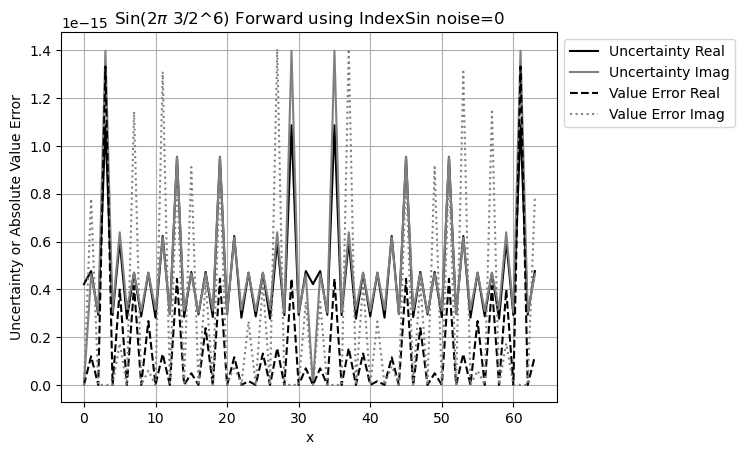

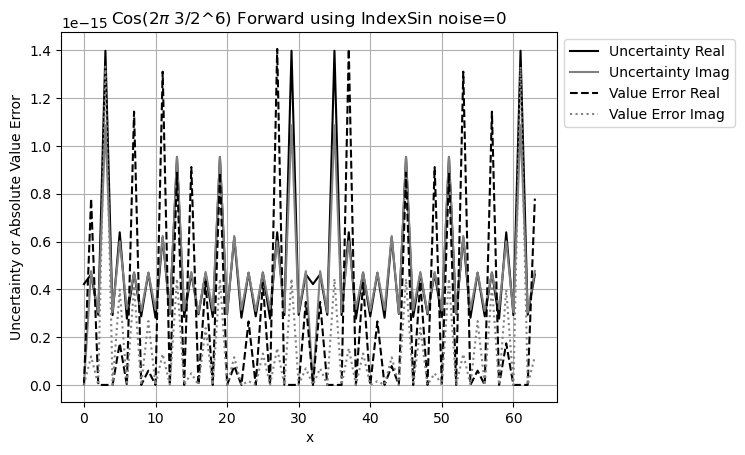

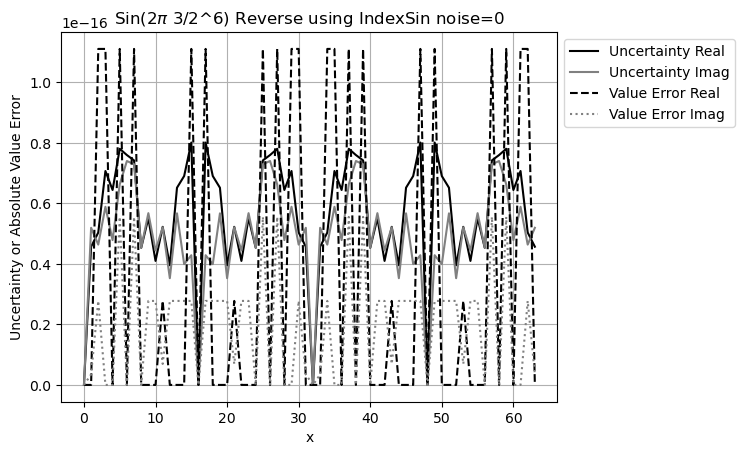

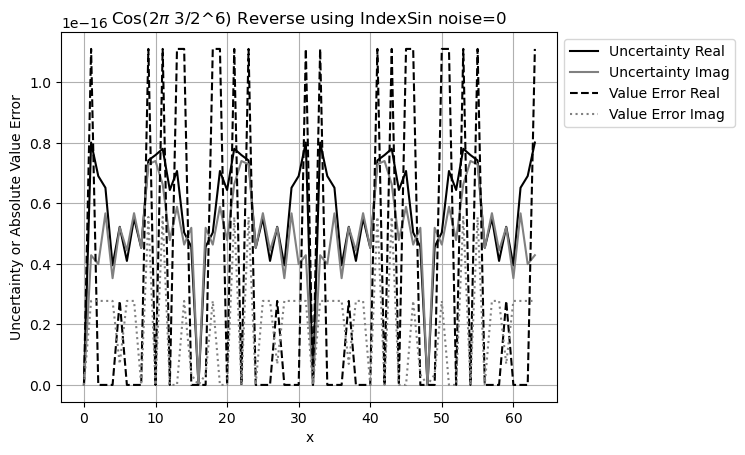

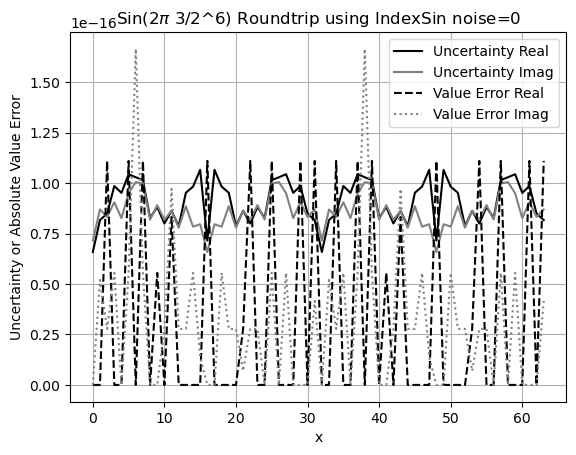

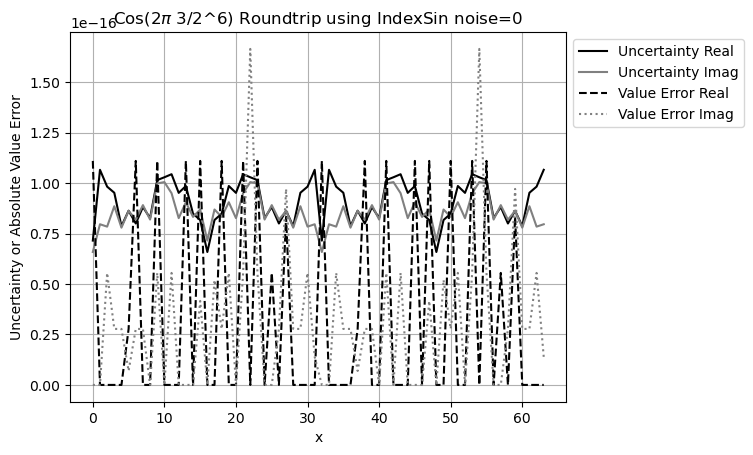

In [128]:
PlotSpectra('IndexSin', ORDER, 'Sin', 3, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Cos', 3, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Sin', 3, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Cos', 3, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Sin', 3, 'Roundtrip')
PlotSpectra('IndexSin', ORDER, 'Cos', 3, 'Roundtrip')

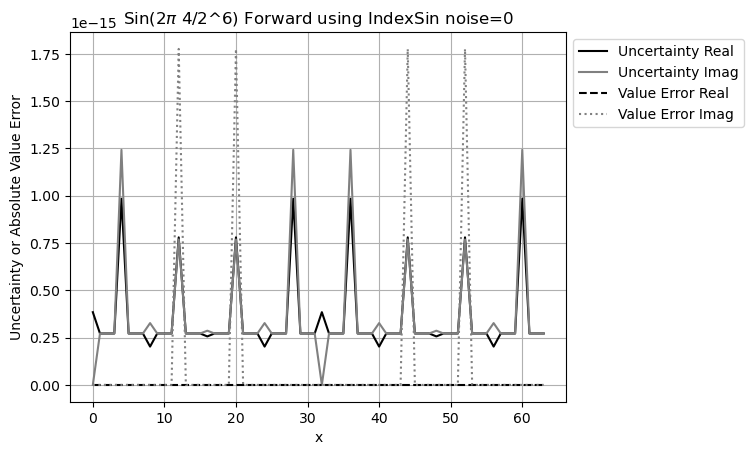

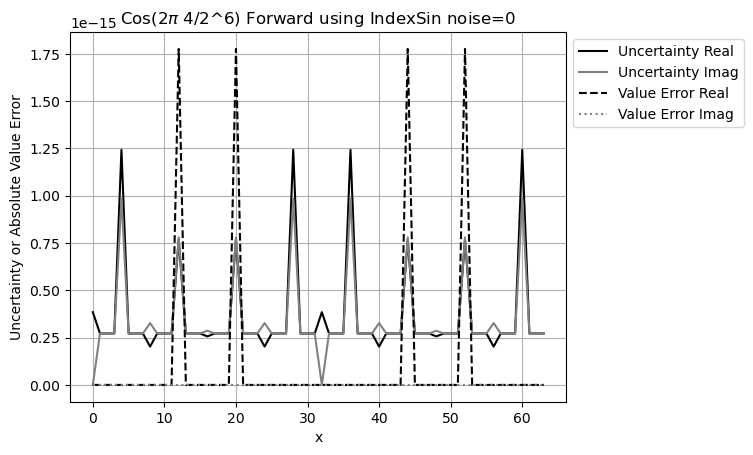

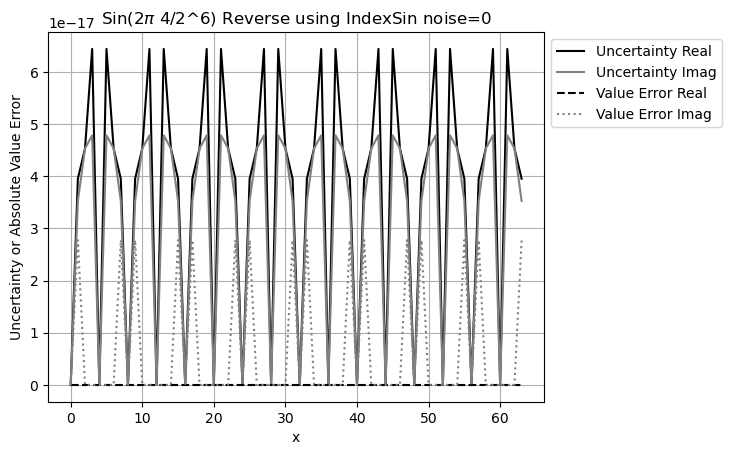

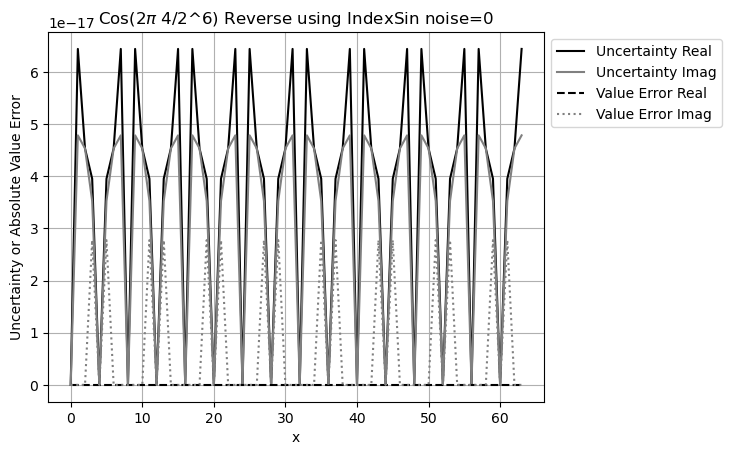

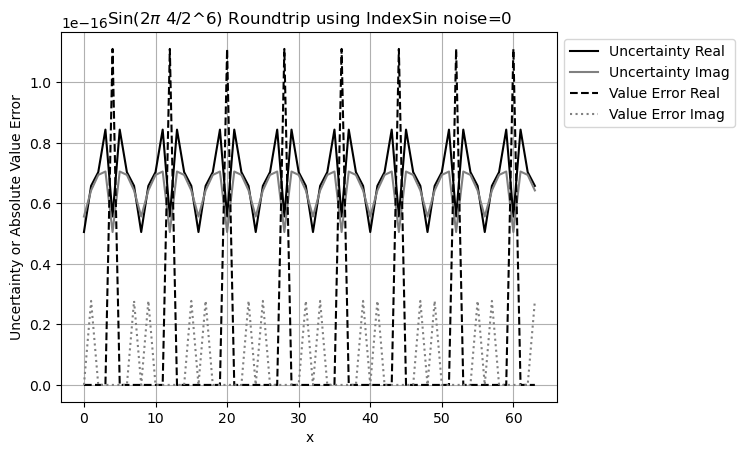

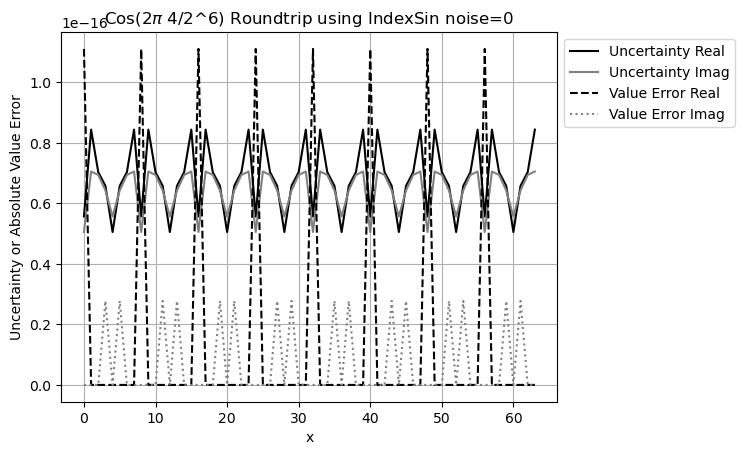

In [129]:
PlotSpectra('IndexSin', ORDER, 'Sin', 4, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Cos', 4, 'Forward')
PlotSpectra('IndexSin', ORDER, 'Sin', 4, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Cos', 4, 'Reverse')
PlotSpectra('IndexSin', ORDER, 'Sin', 4, 'Roundtrip')
PlotSpectra('IndexSin', ORDER, 'Cos', 4, 'Roundtrip')

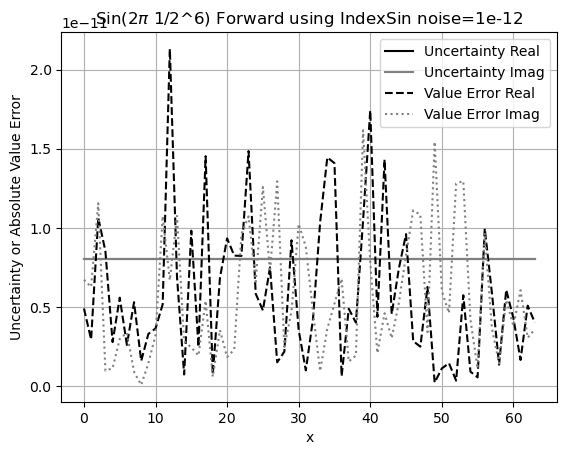

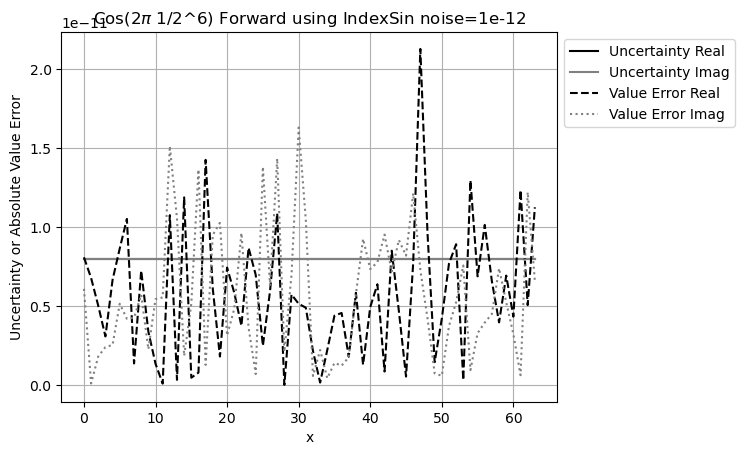

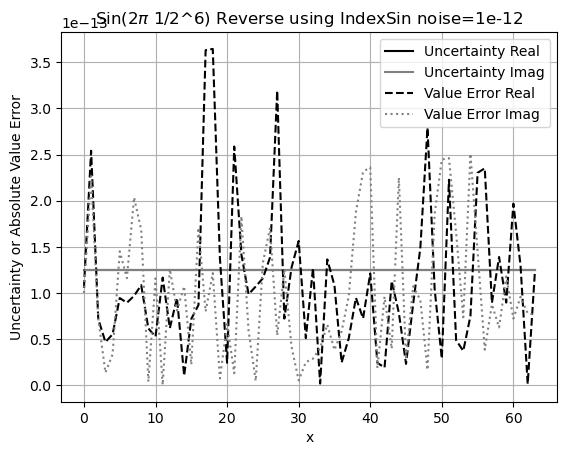

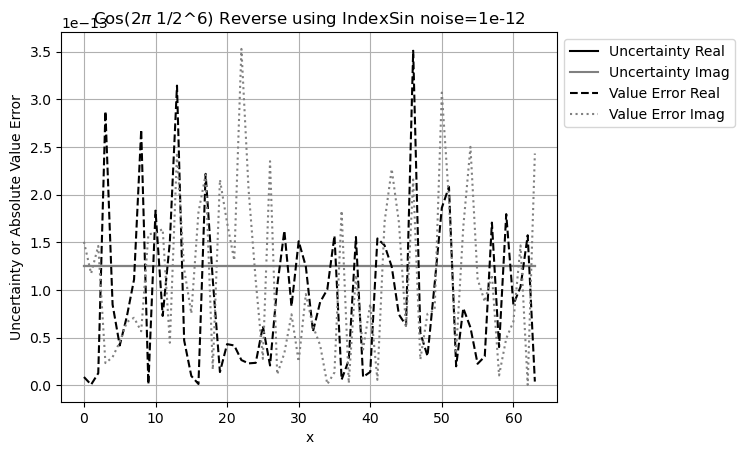

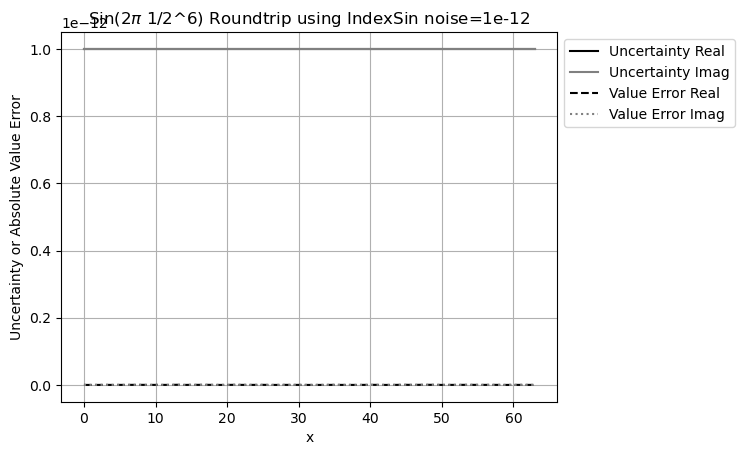

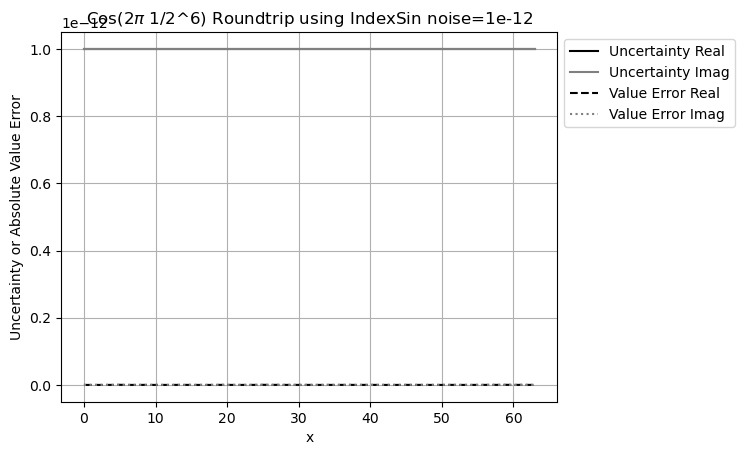

In [130]:
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Forward', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Cos', 1, 'Forward', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Reverse', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Cos', 1, 'Reverse', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Sin', 1, 'Roundtrip', noise=NOISE)
PlotSpectra('IndexSin', ORDER, 'Cos', 1, 'Roundtrip', noise=NOISE)

# Compare different Order Same frequency

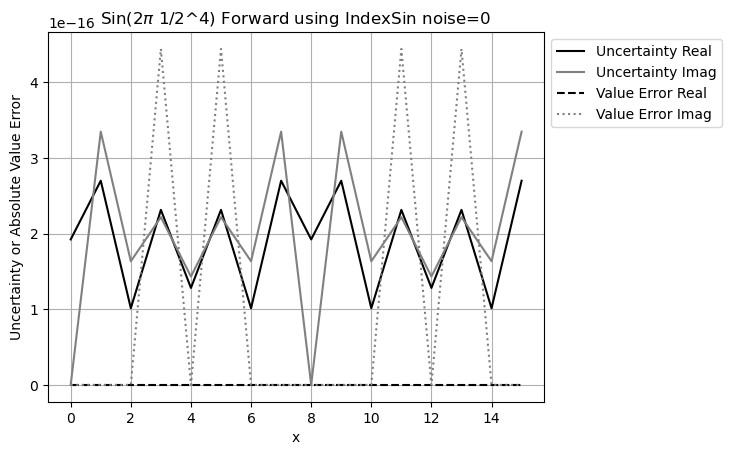

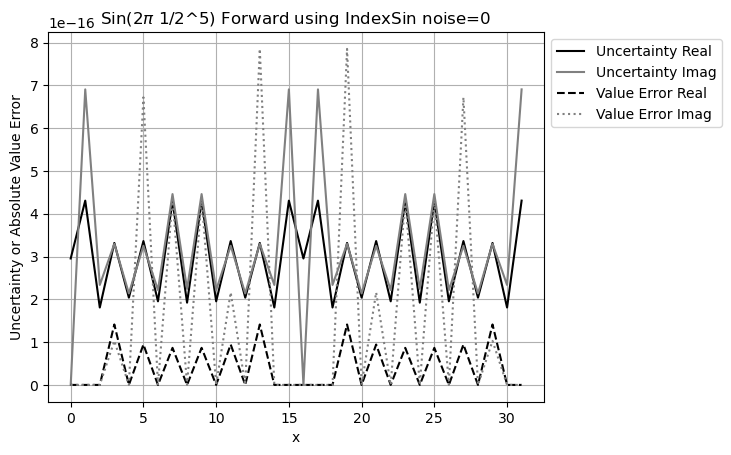

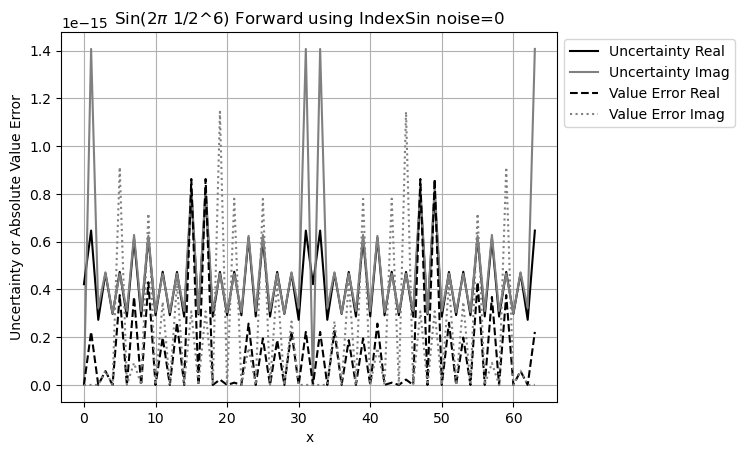

In [131]:
PlotSpectra('IndexSin', 4, 'Sin', 1, 'Forward')
PlotSpectra('IndexSin', 5, 'Sin', 1, 'Forward')
PlotSpectra('IndexSin', 6, 'Sin', 1, 'Forward')

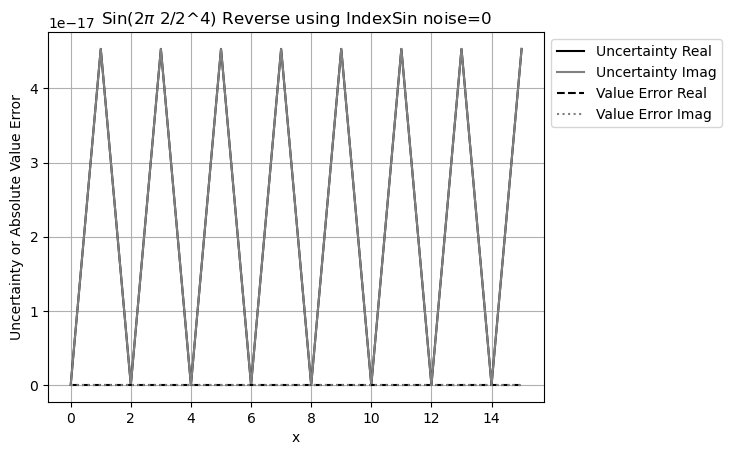

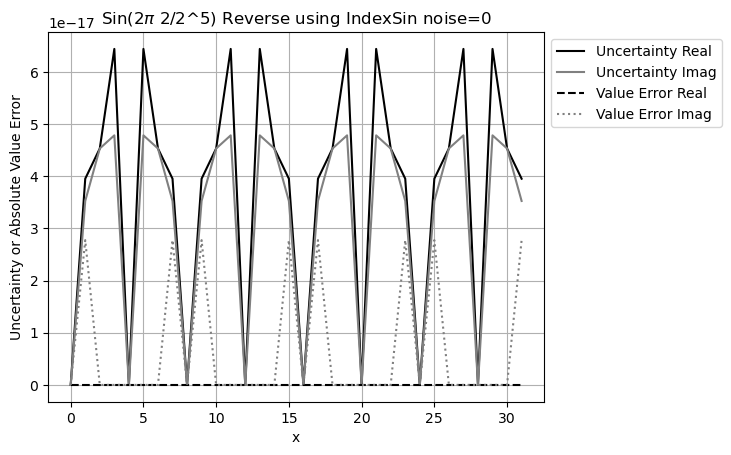

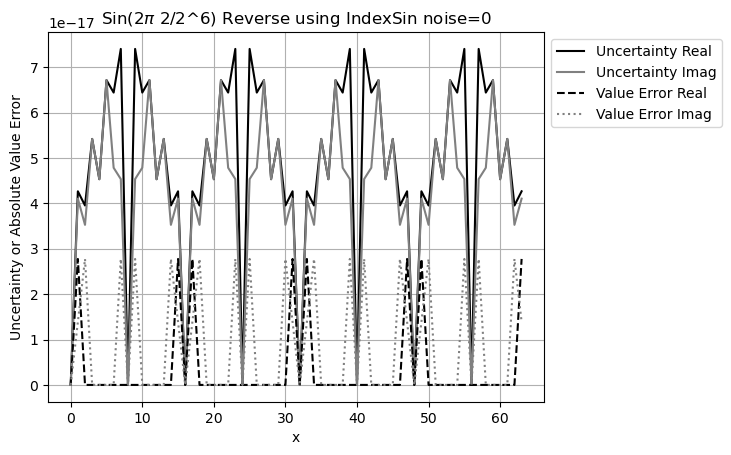

In [132]:
PlotSpectra('IndexSin', 4, 'Sin', 2, 'Reverse')
PlotSpectra('IndexSin', 5, 'Sin', 2, 'Reverse')
PlotSpectra('IndexSin', 6, 'Sin', 2, 'Reverse')

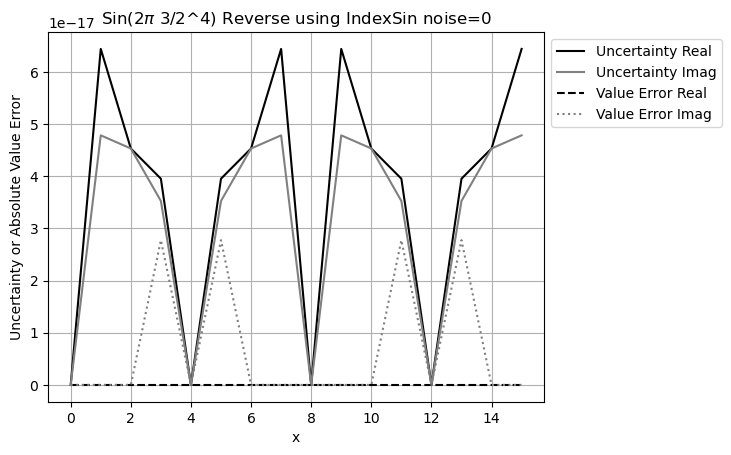

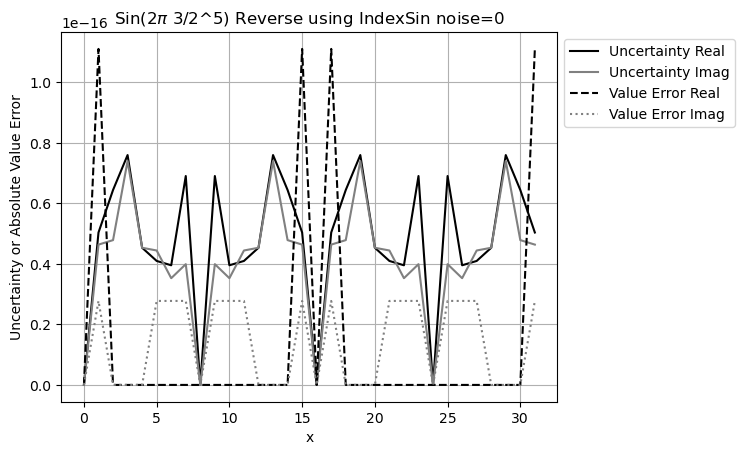

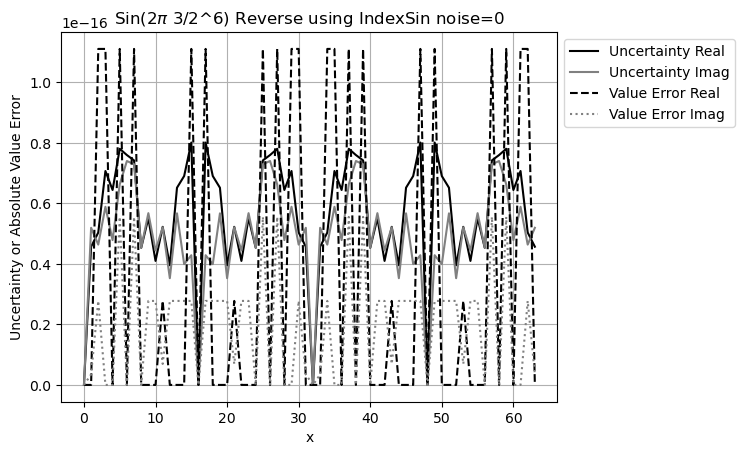

In [133]:
PlotSpectra('IndexSin', 4, 'Sin', 3, 'Reverse')
PlotSpectra('IndexSin', 5, 'Sin', 3, 'Reverse')
PlotSpectra('IndexSin', 6, 'Sin', 3, 'Reverse')

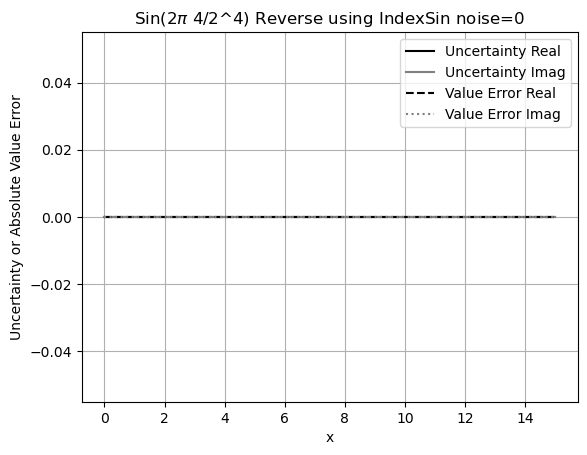

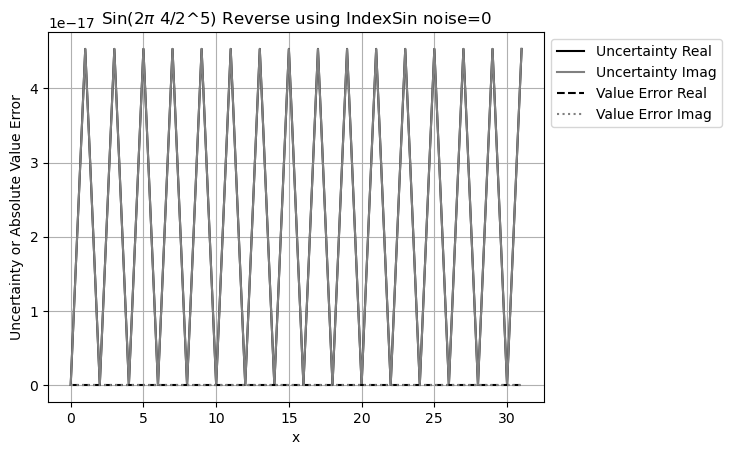

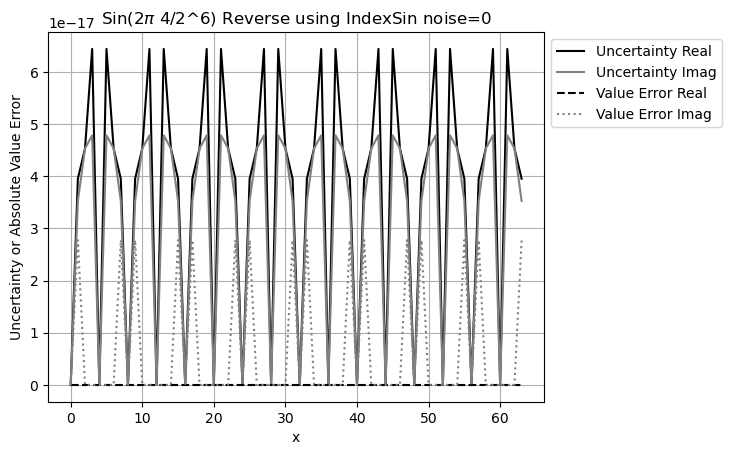

In [134]:
PlotSpectra('IndexSin', 4, 'Sin', 4, 'Reverse')
PlotSpectra('IndexSin', 5, 'Sin', 4, 'Reverse')
PlotSpectra('IndexSin', 6, 'Sin', 4, 'Reverse')

# Compare LibSin with SciPy

In [135]:
def Compare(order, freq, test, noise=0, ylim=[]):
    fig, ax = plt.subplots()
    ax.grid(True)
    ax.set_xlabel('Index')
    ax.set_ylabel('Error')
    if ylim:
        ax.set_ylim(ylim)
    ax.set_title(f'sin(2$\pi$ {freq}/2^{order}): {test} using LibSin noise={noise}')
    
    dfPlot = df[(df['SinSource']=='LibSin') & (df['NoiseType']=='Gaussian') & (df['Noise']==noise) &
                (df['Order']==order) & (df['Signal']=='Sin') & (df['Freq']==freq)]\
                .sort_values('Index')
    dfReal = dfPlot[dfPlot['Imag'] == 0]
    dfImag = dfPlot[dfPlot['Imag'] == 1]
    ax.plot(dfReal['Index'], dfReal[f'{test} Uncertainty'], 'k-', label=f'Uncertainty Real')
    ax.plot(dfImag['Index'], dfImag[f'{test} Uncertainty'], c='gray', ls='-', label=f'Uncertainty Imag')
    ax.plot(dfReal['Index'], np.abs(dfReal[f'{test} Error']), 'k--', label=f'Value Error Real')
    ax.plot(dfImag['Index'], np.abs(dfImag[f'{test} Error']), c='gray', ls=':', label=f'Value Error Imag')
    
    size = 1 << order
    if freq == size/4:
        sWave = [1 if (i%4) == 1 else -1 if (i%4) == 3 else 0 for i in range(0,size)]
    else:
        sWave = [math.sin(math.pi*2*freq *i/size) for i in range(0,size)]
    sFreq = [0] * size
    sFreq[freq] = -size *0.5j
    sFreq[size - freq] = +size *0.5j
    if test == 'Forward':
        sRes = sp.fft.fft(sWave, n=size)
        sError = sRes - sFreq
    elif test == 'Reverse':
        sRes = sp.fft.ifft(sFreq, n=size)
        sError = sRes - sWave
    elif test == 'Roundtrip':
        sRes = sp.fft.ifft( sp.fft.fft(sWave, n=size), n=size)
        sError = sRes - sWave
    else:
        raise ValueError(f'Invalid test={test}')
    sReal = np.array([c.real() if type(c) == complex else c for c in sError])
    sImag = np.array([c.real() if type(c) == complex else 0 for c in sError])
    ax.plot(range(len(sError)), np.abs(sReal), 'kx', label=f'SciPy Error Real')
    #ax.plot(range(len(sError)), np.abs(sImag), 'r+', label=f'SciPy Error Imag')

    ax.legend(bbox_to_anchor=(1.0, 1.0))


In [136]:
def CompareAllTest(order, freq, noise=0):
    Compare(order, freq, 'Forward', noise=noise)
    Compare(order, freq, 'Reverse', noise=noise)
    Compare(order, freq, 'Roundtrip', noise=noise)

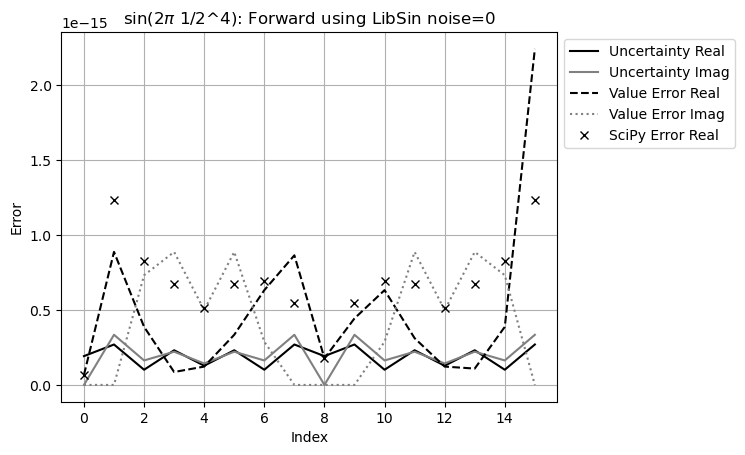

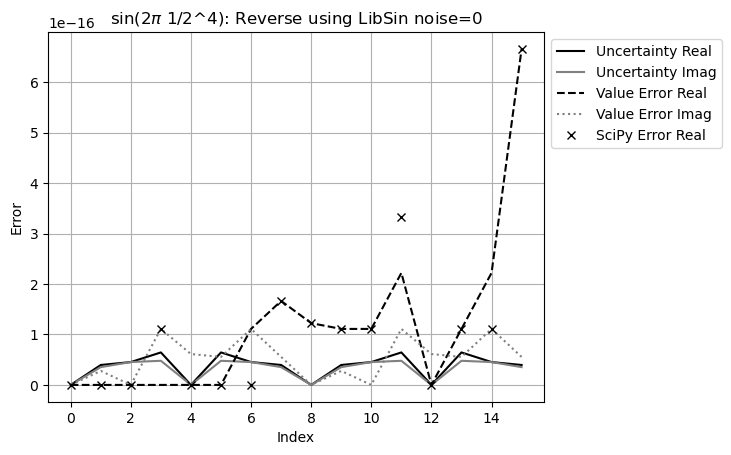

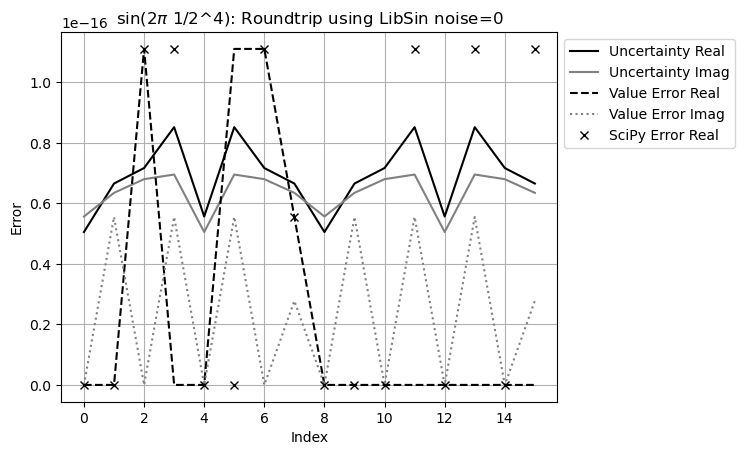

In [137]:
CompareAllTest(4,1)

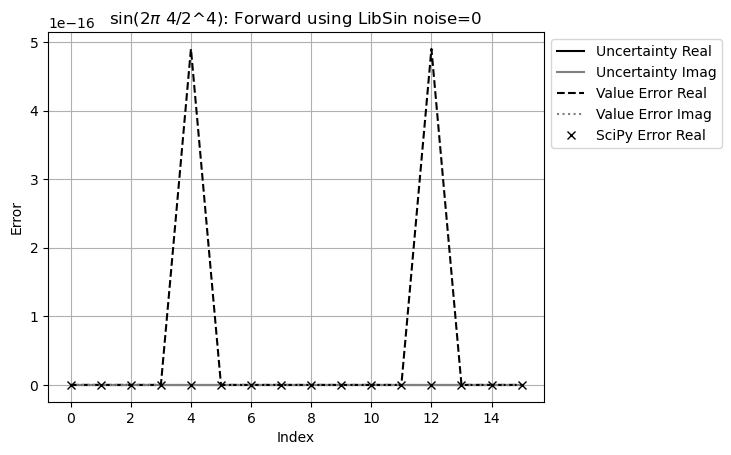

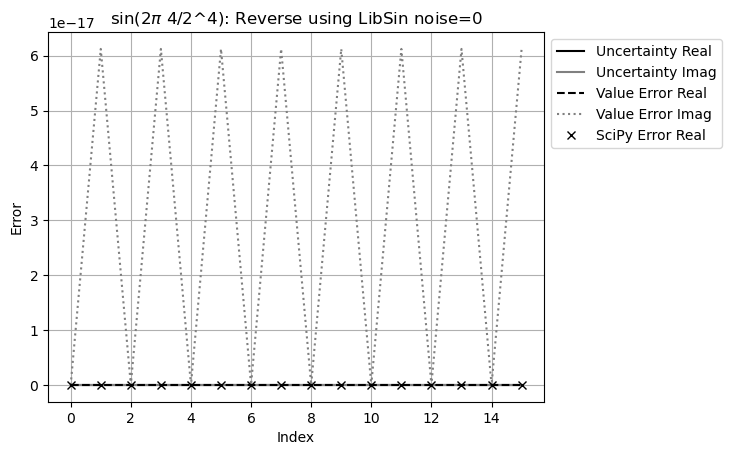

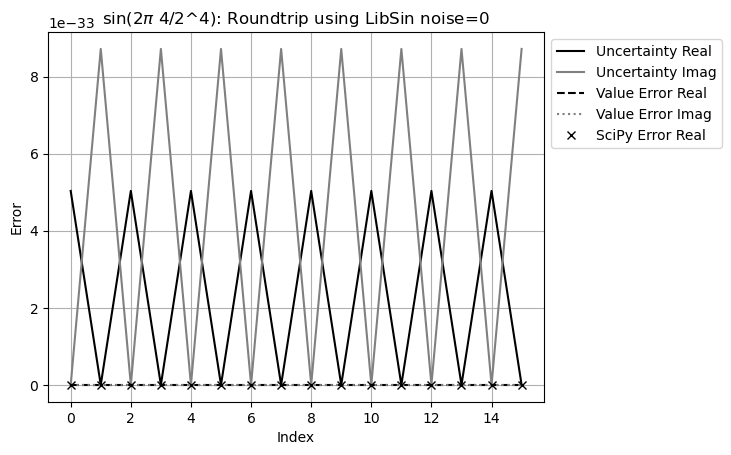

In [138]:
CompareAllTest(4,4)

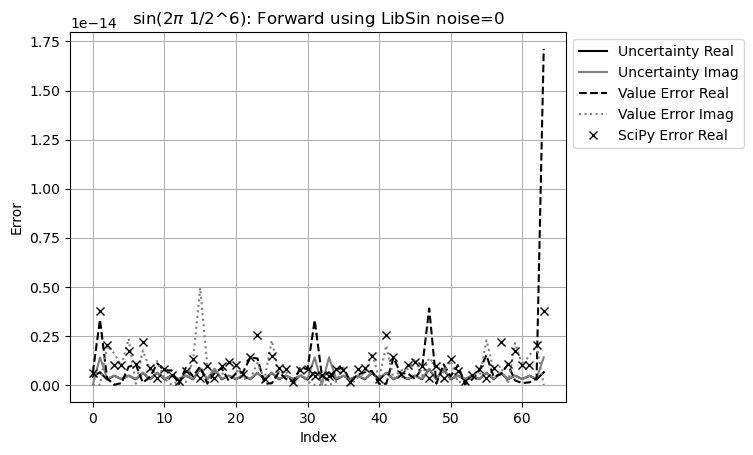

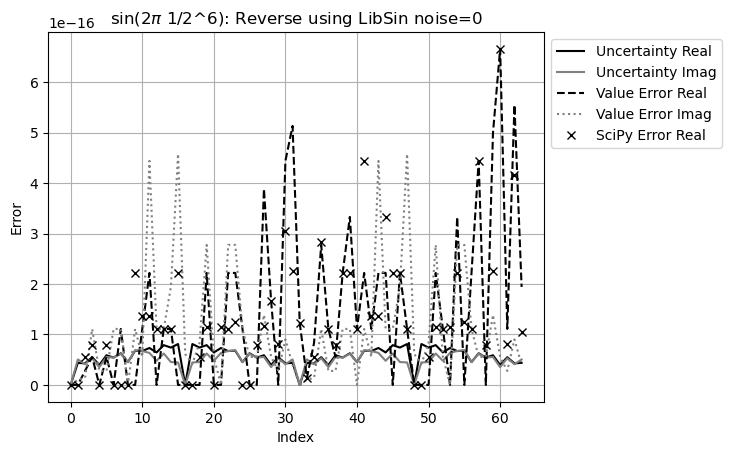

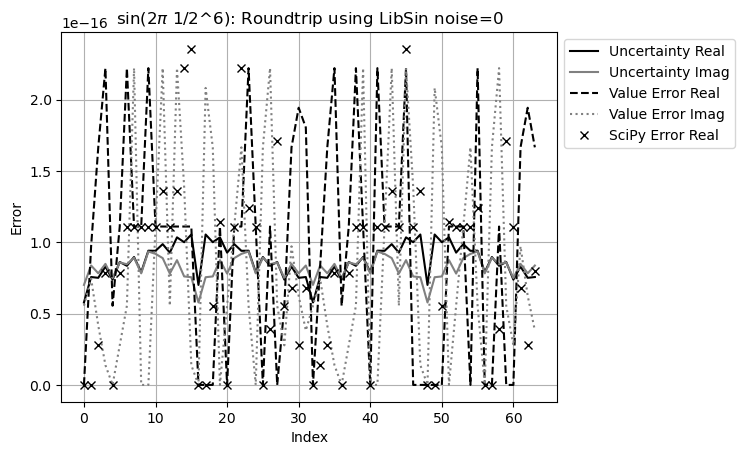

In [139]:
CompareAllTest(ORDER,1)

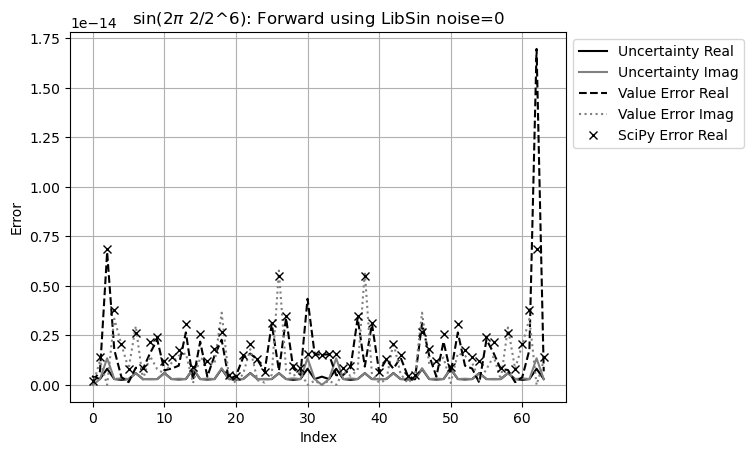

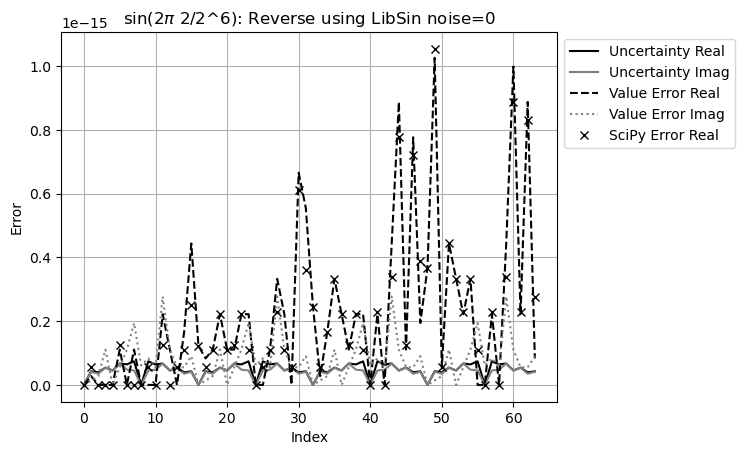

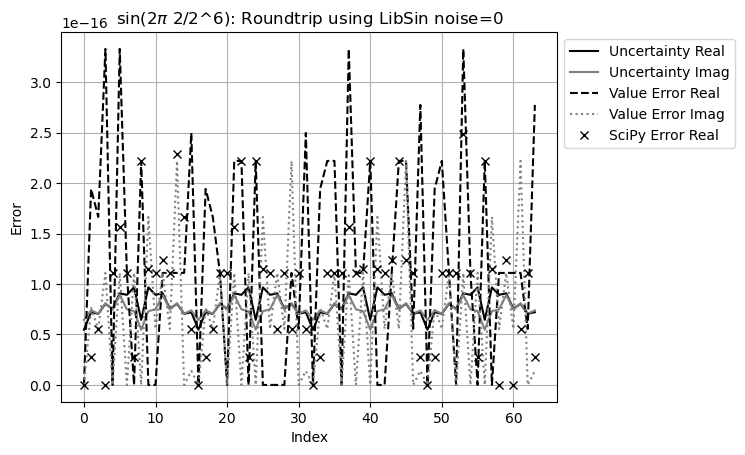

In [140]:
CompareAllTest(ORDER,2)

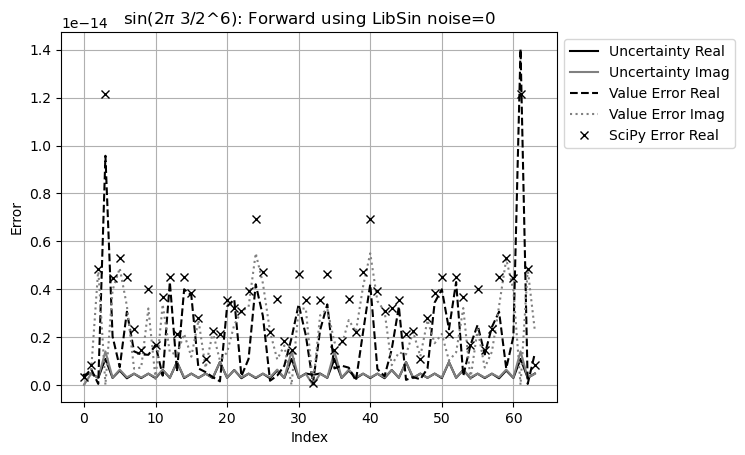

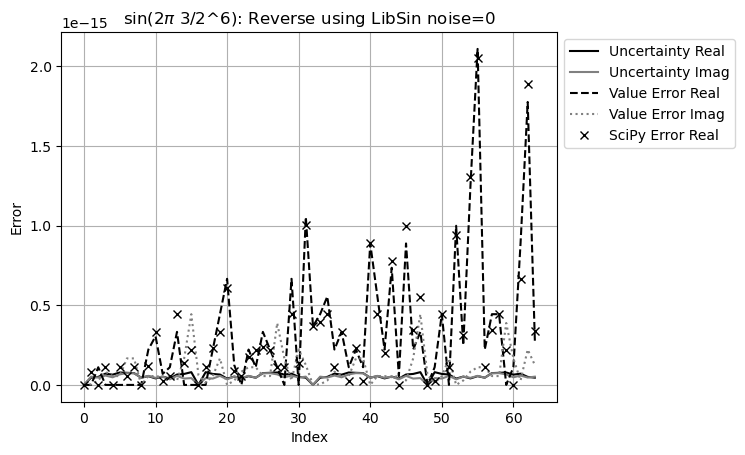

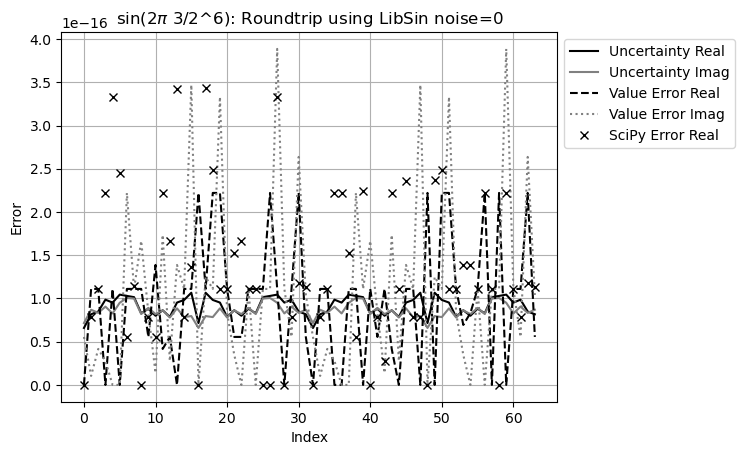

In [141]:
CompareAllTest(ORDER,3)

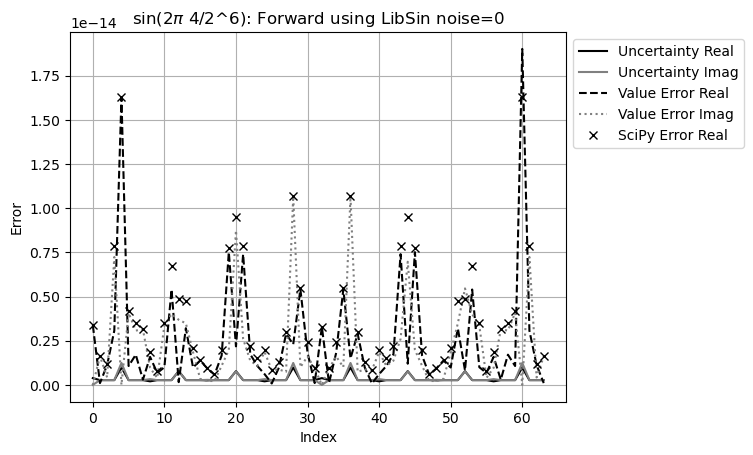

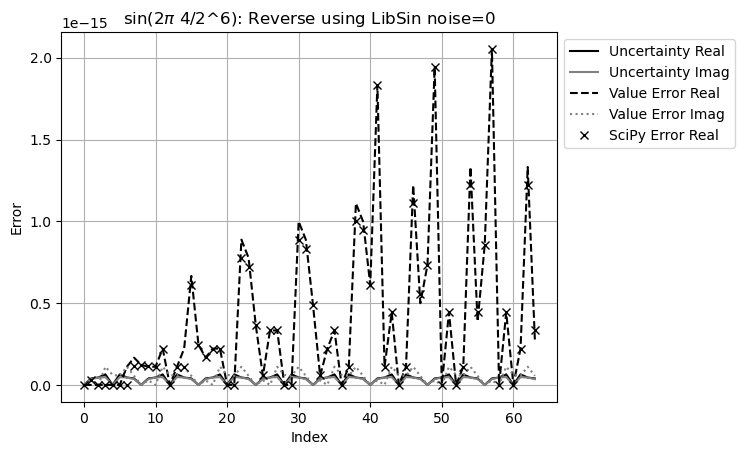

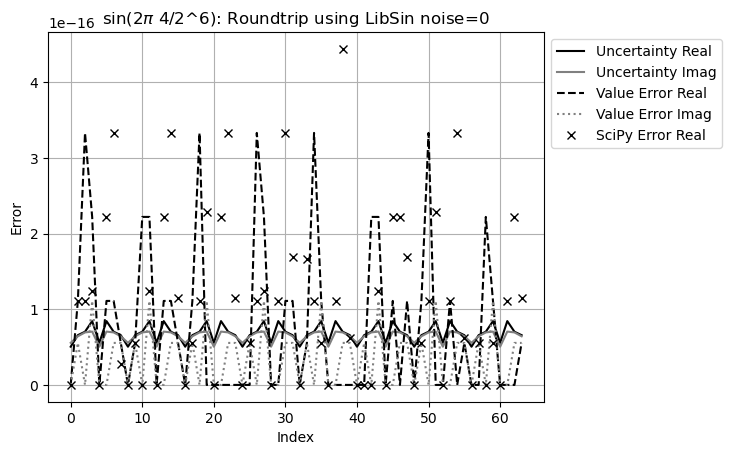

In [142]:
CompareAllTest(ORDER,4)

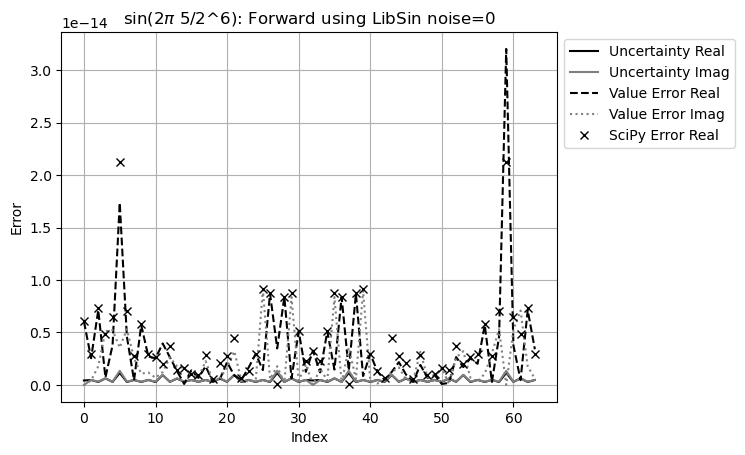

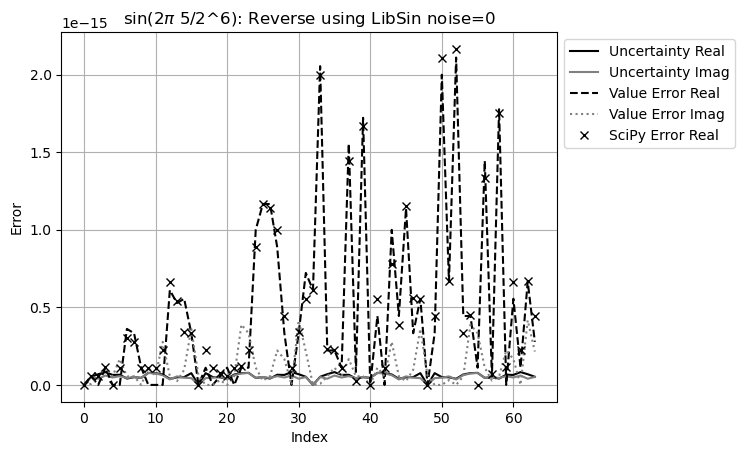

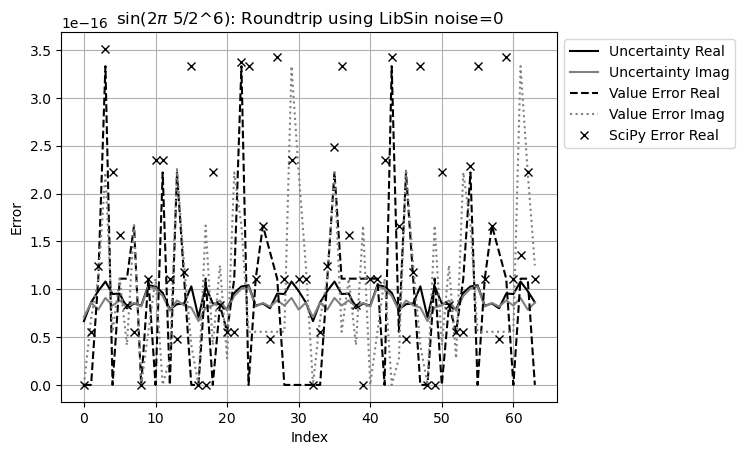

In [143]:
CompareAllTest(ORDER,5)

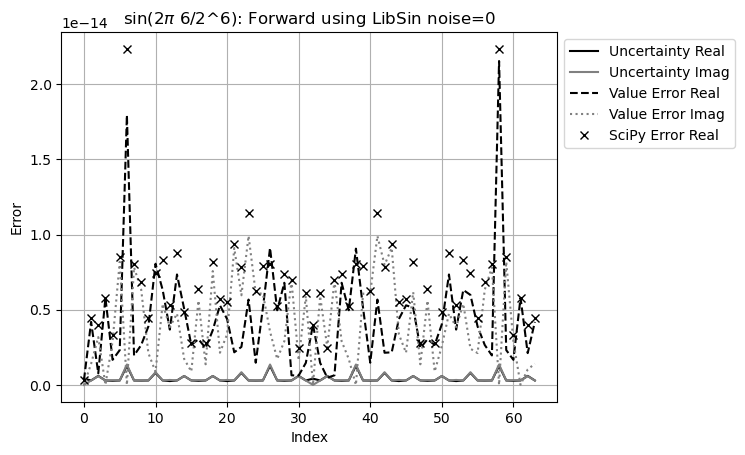

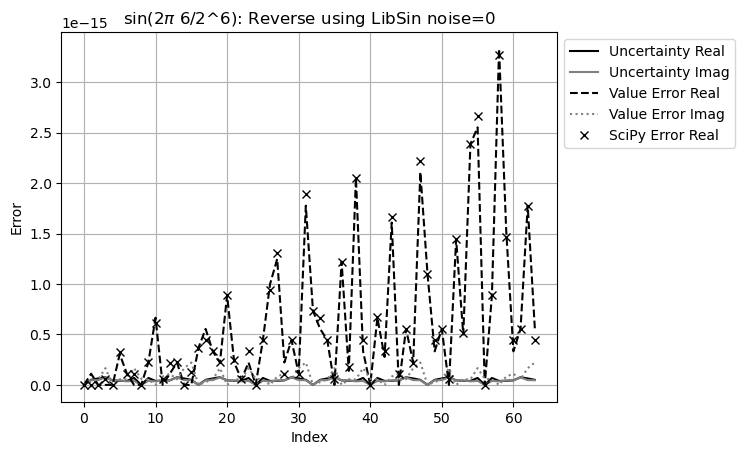

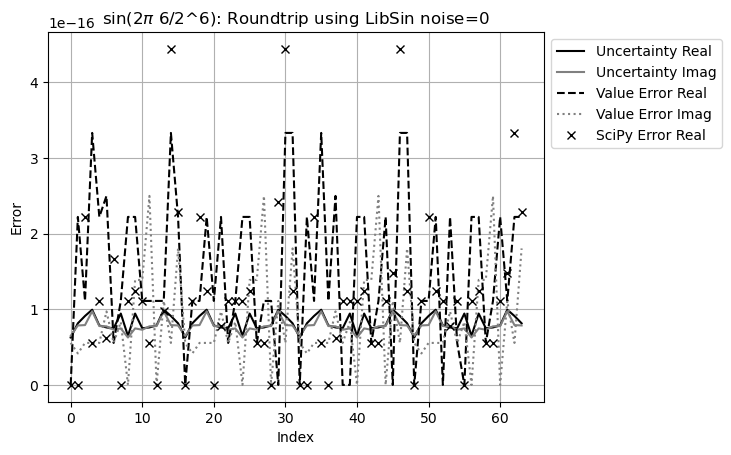

In [144]:
CompareAllTest(ORDER,6)

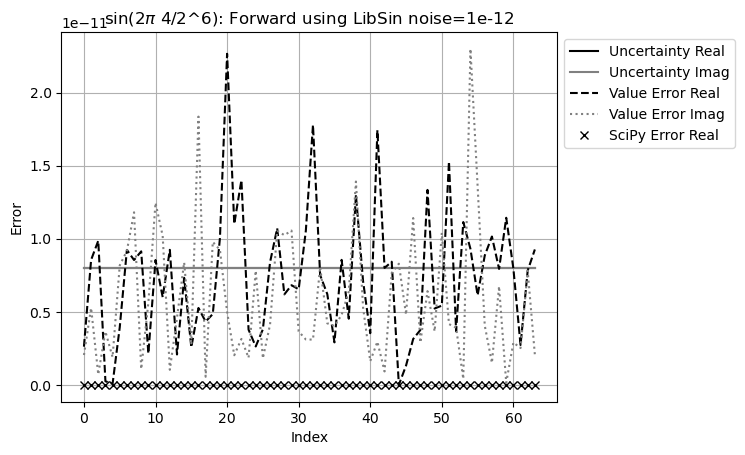

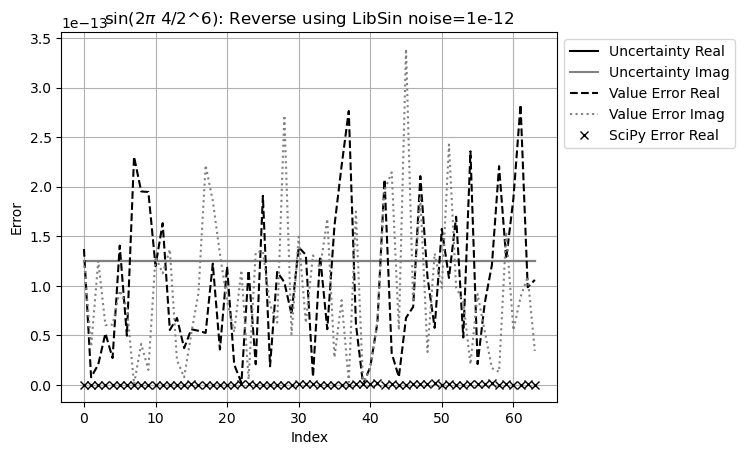

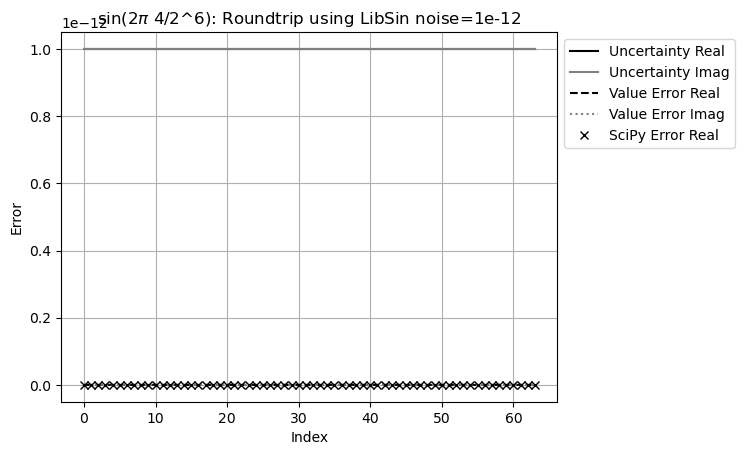

In [146]:
CompareAllTest(ORDER,4,noise=NOISE)

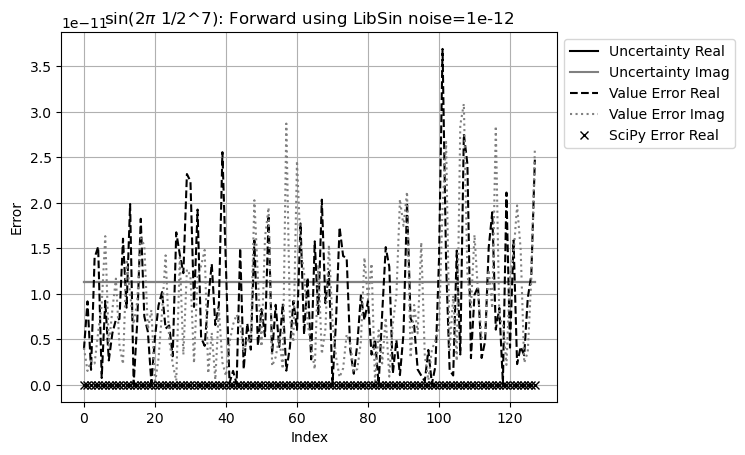

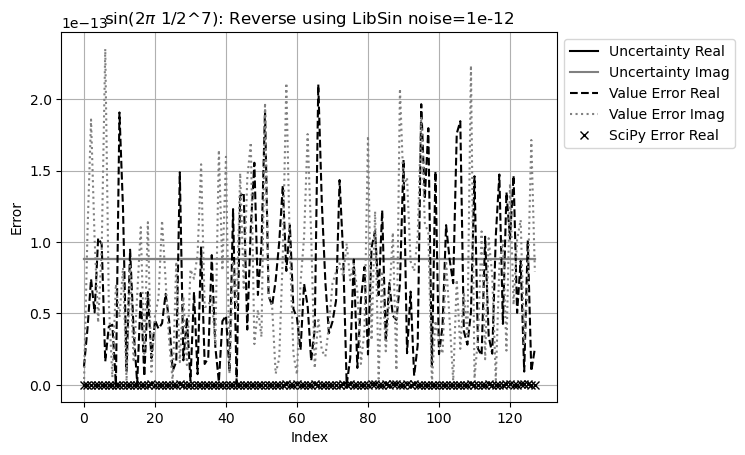

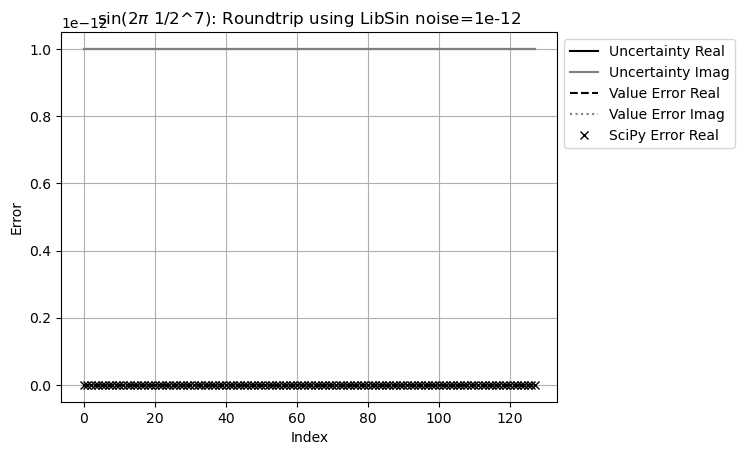

In [148]:
CompareAllTest(7,1,noise=NOISE)